In [138]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.regression.rolling import RollingOLS
import warnings
import glob
warnings.filterwarnings('ignore')



def norm_plot(df):
    df = df.copy()
    df = (df - df.mean()) / df.std()
    return df

def add_moving_averages(df, moving_averages, columns):
    df = df.copy()
    for ma in moving_averages:
        for col in columns:
            new_col = f'{col}_ma{ma}'
            df[new_col] = df[col].rolling(window=ma).mean()
    # ffill na
    df.fillna(method='ffill', inplace=True)
    return df

from tabulate import tabulate
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error

# If window param is set, then spread is calculated on a rolling basis
def get_spread(S1, S2, window=None):
    s1_ols = sm.add_constant(S1)
    if window:
        spread_model = sm.regression.rolling.RollingOLS(S2, s1_ols, window=window).fit()
    else:
        spread_model = sm.OLS(S2, s1_ols).fit()
    beta = spread_model.params[S1.name]
    spread = S2 - beta * S1
    return spread


def create_dataset(data, look_back, target_col="spread_close", split_sizes=[0.6, 0.2, 0.2], drop_cols: list = []):
    data = data.copy().dropna()
    y = data[target_col]
    y_shifted = y.shift(-look_back)

    data["target"] = y_shifted
    data = data.dropna().drop(drop_cols, axis=1)
    train_size = int(len(data) * split_sizes[0])
    val_size = int(len(data) * split_sizes[1])
    test_size = len(data) - train_size - val_size

    print("\n------Dataset Information------")
    print(tabulate([
            ["Train", train_size, data.index[train_size].date()],
            ["Val", val_size, data.index[-val_size].date()],
            ["Test", test_size, data.index[-test_size].date()]],
        ["Set", "Size", "Date Cutoff"]))

    train_data = data.iloc[:train_size]
    val_data = data.iloc[train_size : train_size + val_size]
    test_data = data.iloc[-test_size:]
    return train_data, val_data, test_data


def prepare_dataset(train_data, val_data, test_data):
    X_train, y_train = train_data.drop(columns=["target"]), train_data["target"]
    X_val, y_val = val_data.drop(columns=["target"]), val_data["target"]
    X_test, y_test = test_data.drop(columns=["target"]), test_data["target"]

    return X_train, y_train, X_val, y_val, X_test, y_test



data_dir = '../data/'
price_history_dir = data_dir + 'price_history/'
sentiment_dir = data_dir + 'sentiments/'
ti_dir = data_dir + 'technical_indicators/'

# Load Ticker Pairs
tickers_list = [file.split('/')[-1].strip('.csv') for file in glob.glob(price_history_dir + '*.csv')]
pairs_df = pd.read_csv(data_dir + 'ranked_pairs_snp.csv')
pairs = pairs_df[['ticker_0', 'ticker_1']].values
unique_pairs = pairs_df[['ticker_0', 'ticker_1']].drop_duplicates('ticker_0', keep='first').drop_duplicates('ticker_1', keep='first')

# Load Ticker History, Sentiment, and Technical Indicators
class TickerData:
    def __init__(self, ticker):
        self.ticker = ticker
        self.history = pd.read_csv(price_history_dir + f'{ticker}.csv', index_col='Date', date_format='%Y-%m-%d')
        self.sentiment = pd.read_csv(sentiment_dir + f'{ticker}.csv', index_col='Date', date_format='%Y-%m-%d')
        self.ti = pd.read_csv(ti_dir + f'{ticker}.csv', index_col='Date', date_format='%Y-%m-%d')
    def __repr__(self):
        return repr(self.history['Adj Close'])

class DATA:
    pass

data = {}
for ticker in tickers_list:
    setattr(DATA, ticker, TickerData(ticker))
    data[ticker] = TickerData(ticker)

# Functions for data processing
def join_sentiment(data, pair, add_sentiment_ma=False):
    pair_sentiment_df = pd.merge(data[pair[0]].sentiment, data[pair[1]].sentiment, left_index=True, right_index=True, suffixes=("_S1", "_S2"))
    if add_sentiment_ma:
        pair_sentiment_df = add_moving_averages(pair_sentiment_df, [5, 10, 20], columns=pair_sentiment_df.columns)
    return pair_sentiment_df

def join_technical_indicators(data, pair):
    return pd.merge(data[pair[0]].ti, data[pair[1]].ti, left_index=True, right_index=True, suffixes=("_S1", "_S2"))

# If window param is set, then spread is calculated on a rolling basis
def get_spread(S1, S2, window=None):
    s1_ols = sm.add_constant(S1)
    if window:
        spread_model = sm.regression.rolling.RollingOLS(S2, s1_ols, window=window).fit()
    else:
        spread_model = sm.OLS(S2, s1_ols).fit()
    beta = spread_model.params[S1.name]
    spread = S2 - beta * S1
    return spread

def calculate_spread(pair_df, spread_window, ma_high, ma_low):
    spread = get_spread(pair_df['Adj Close_S1'], pair_df['Adj Close_S2'], window=spread_window)
    pair_df['spread'] = spread

    ma_high_values = pair_df.spread.rolling(window=ma_high).mean()
    ma_low_values = pair_df.spread.rolling(window=ma_low).mean()
    std_high = pair_df.spread.rolling(window=ma_high).std()

    moving_zscore = (ma_low_values - ma_high_values) / std_high
    pair_df['zscore_spread'] = moving_zscore
    return pair_df

def setup_dataset(pair_df, look_back, drop_cols):
    train_data, val_data, test_data = create_dataset(pair_df, look_back=look_back, target_col="zscore_spread", drop_cols=drop_cols)
    X_train, y_train, X_val, y_val, X_test, y_test = prepare_dataset(train_data, val_data, test_data)
    X_test = pd.concat([X_val, X_test])
    y_test = pd.concat([y_val, y_test])
    return X_train, y_train, X_test, y_test




# Main function to execute different configurations
def build_configuration(config):
    pair = pairs[config['PAIR_IDX']]
    pair_sentiment_df = join_sentiment(data, pair, config['ADD_SENTIMENT_MA'])
    pair_ti_df = join_technical_indicators(data, pair)
    pair_df = pd.merge(pair_ti_df, pair_sentiment_df, left_index=True, right_index=True, how="left")

    pair_df = calculate_spread(pair_df, config['SPREAD_WINDOW'], config['MA_HIGH'], config['MA_LOW']).dropna()
    X_train, y_train, X_test, y_test = setup_dataset(pair_df, config['LOOK_BACK'], config['DROP_COLS'])

    return pair_df, X_train, y_train, X_test, y_test

# Example configurations

configurations = [
    {
        'PAIR_IDX': 0,
        'ADD_SENTIMENT_MA': True,
        'SPREAD_WINDOW': None,
        'MA_HIGH': 60,
        'MA_LOW': 5,
        'LOOK_BACK': 3,
        'DROP_COLS': []
    },
    {
        'PAIR_IDX': 1,
        'ADD_SENTIMENT_MA': True,
        'SPREAD_WINDOW': 20,
        'MA_HIGH': 50,
        'MA_LOW': 10,
        'LOOK_BACK': 5,
        'DROP_COLS': ['Adj Close_S1', 'Adj Close_S2']
    },
    # Add more configurations as needed
]


pair_df, X_train, y_train, X_test, y_test = build_configuration(
    configurations[0])

# pd.concat([X_train, y_train], axis=1).head(30).to_csv("full_feature_set_example.csv")


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     451  2023-01-12
Val       150  2023-08-21
Test      151  2023-08-18


In [2]:
### Prep Data 
config_to_use = configurations[0]
display(config_to_use)
pair_df, X_train, y_train, X_test, y_test = build_configuration(
    config_to_use)
print(f"\nNo. of features: {X_train.shape[1]}")

pair_df.head(2)

{'PAIR_IDX': 0,
 'ADD_SENTIMENT_MA': True,
 'SPREAD_WINDOW': None,
 'MA_HIGH': 60,
 'MA_LOW': 5,
 'LOOK_BACK': 3,
 'DROP_COLS': []}


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     451  2023-01-12
Val       150  2023-08-21
Test      151  2023-08-18

No. of features: 270


,High_S1,Low_S1,Open_S1,Volume_S1,Adj Close_S1,P_S1,R1_S1,R2_S1,R3_S1,S1_S1,...,twitter_pos_sentiment_count_S2_ma10,news_pos_sentiment_count_S2_ma10,news_pos_sentiment_count_S1_ma20,news_sentiment_daily_avg_S1_ma20,twitter_pos_sentiment_count_S1_ma20,news_sentiment_daily_avg_S2_ma20,twitter_pos_sentiment_count_S2_ma20,news_pos_sentiment_count_S2_ma20,spread,zscore_spread
Date,,,,,,,,,,,,,,,,,,,,,
2021-03-30,335.75,328.85,329.41,2717270.0,332.01,332.203333,334.839133,336.467533,339.103333,329.567533,...,8.1,0.4,1.3,-0.026465,7.75,0.002685,7.6,0.45,-63.225426,-0.407533
2021-03-31,332.65,325.44,330.23,2624540.0,327.00,328.363333,331.117553,332.819113,335.573333,325.609113,...,8.9,0.4,1.2,-0.027030,7.55,0.002685,7.8,0.45,-46.265097,-0.272490


In [77]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error

def calculate_metrics(y_true, y_pred):
    metric_frame = {
        "mape": mean_absolute_percentage_error(y_true, y_pred),
        "mse": mean_squared_error(y_true, y_pred),
        "mae": mean_absolute_error(y_true, y_pred),
        "r2": r2_score(y_true, y_pred)
    }
    print(f"\nR2: {metric_frame['r2']:.2f}, MAE: {metric_frame['mae']:.2f}, MAPE: {metric_frame['mape']*100:.2f}%")
    return metric_frame


def train(model, X_train, y_train, X_test, y_test, model_results, plot=True):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    model_name = model.__class__.__name__
    print(f"\n{model_name}")
    model_results[model_name] = calculate_metrics(y_test, y_pred)
    if plot:
        fig, ax = plt.subplots(figsize=(10, 5))
        ax.plot(y_test.index, y_test, label="Actual")
        ax.plot(y_test.index, y_pred, label=f"Predicted ({model_name})")
        ax.legend()
        plt.show()
    return y_pred
model_results = {}


R2: -0.68, MAE: 1.06, MAPE: 253.27%


{'PAIR_IDX': 0,
 'ADD_SENTIMENT_MA': True,
 'SPREAD_WINDOW': None,
 'MA_HIGH': 60,
 'MA_LOW': 5,
 'LOOK_BACK': 3,
 'DROP_COLS': []}


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     526  2023-05-02
Val       150  2023-08-21
Test       76  2023-12-05
No. of features: 270

R2: 0.76, MAE: 0.40, MAPE: 126.46%


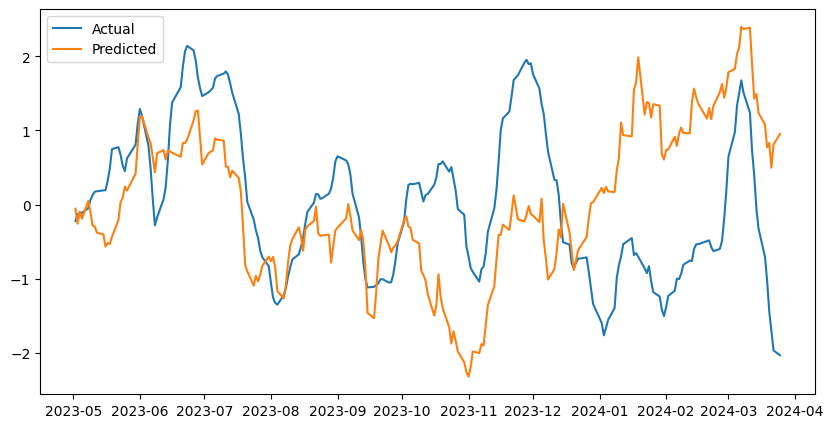

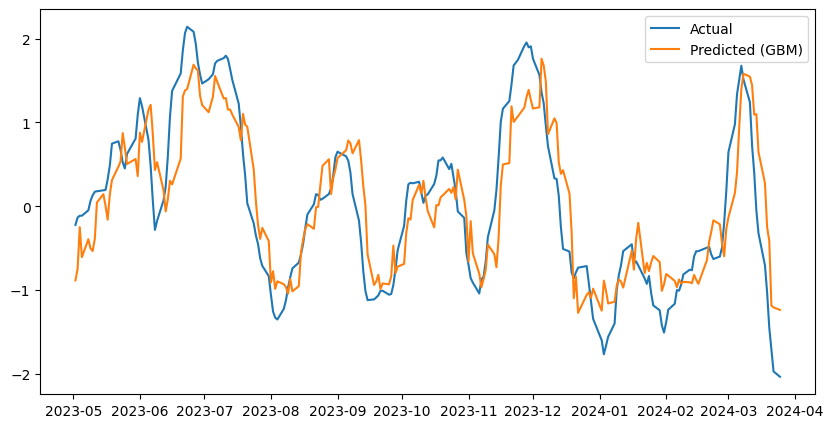

270 270


In [19]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error

def calculate_metrics(y_true, y_pred):
    metric_frame = {
        "mape": mean_absolute_percentage_error(y_true, y_pred),
        "mse": mean_squared_error(y_true, y_pred),
        "mae": mean_absolute_error(y_true, y_pred),
        "r2": r2_score(y_true, y_pred)
    }
    print(f"\nR2: {metric_frame['r2']:.2f}, MAE: {metric_frame['mae']:.2f}, MAPE: {metric_frame['mape']*100:.2f}%")

# ---- Model Training ----
model_reg = LinearRegression()
model_reg.fit(X_train, y_train)

y_pred = model_reg.predict(X_test)

model_results = {}
model_results['Vanilla Regression'] = calculate_metrics(y_test, y_pred)


fig = plt.figure(figsize=(10, 5))
plt.plot(y_test.index, y_test, label="Actual")
plt.plot(y_test.index, y_pred, label="Predicted")
plt.legend()

config_to_use = configurations[0]
display(config_to_use)
pair_df, X_train, y_train, X_test, y_test = build_configuration(
    config_to_use)
print(f"No. of features: {X_train.shape[1]}")

from sklearn.ensemble import GradientBoostingRegressor

# Train GBM model
model_gbm = GradientBoostingRegressor(n_estimators=100, random_state=42)
model_gbm.fit(X_train, y_train)

# Make predictions on the test set
y_pred_gbm = model_gbm.predict(X_test)

# Calculate evaluation metrics
model_results['GBM'] = calculate_metrics(y_test, y_pred_gbm)

# Plot actual vs. predicted values
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(y_test.index, y_test, label="Actual")
ax.plot(y_test.index, y_pred_gbm, label="Predicted (GBM)")
ax.legend()
plt.show()


# get feature importance
feature_importance = model_reg.coef_

print(len(X_train.columns), len(feature_importance))



### Single Config Setup

In [141]:
selected_config = {
    'PAIR_IDX': 0,
    'ADD_SENTIMENT_MA': True,
    'SPREAD_WINDOW': None,
    'MA_HIGH': 60,
    'MA_LOW': 5,
    'LOOK_BACK': 2,
    'DROP_COLS': []
}

# selected_config = configurations[0]
display(selected_config)
pair_df, X_train, y_train, X_test, y_test = build_configuration(selected_config)
print(f"No. of features: {X_train.shape[1]}")

{'PAIR_IDX': 0,
 'ADD_SENTIMENT_MA': True,
 'SPREAD_WINDOW': None,
 'MA_HIGH': 60,
 'MA_LOW': 5,
 'LOOK_BACK': 2,
 'DROP_COLS': []}


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     451  2023-01-12
Val       150  2023-08-22
Test      152  2023-08-18
No. of features: 270


### Single Config Training

In [25]:
!pip install lightgbm


LinearRegression

R2: -8928024680777.93, MAE: 2686949.94, MAPE: 721657301.03%

GradientBoostingRegressor

R2: 0.81, MAE: 0.40, MAPE: 146.31%

LGBMRegressor

R2: 0.82, MAE: 0.38, MAPE: 146.82%

RandomForestRegressor

R2: 0.83, MAE: 0.37, MAPE: 152.00%

SVR

R2: -1.02, MAE: 1.30, MAPE: 359.15%

KNeighborsRegressor

R2: -0.32, MAE: 1.04, MAPE: 167.42%

LinearRegression

R2: -8928024680777.93, MAE: 2686949.94, MAPE: 721657301.03%


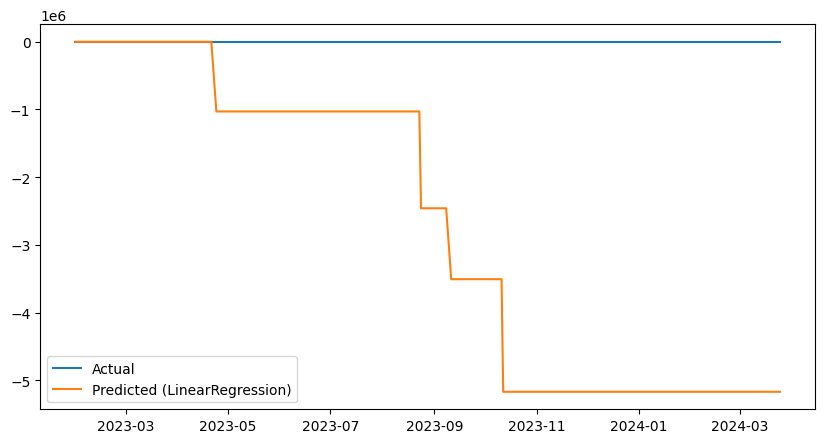


GradientBoostingRegressor

R2: 0.81, MAE: 0.40, MAPE: 146.31%


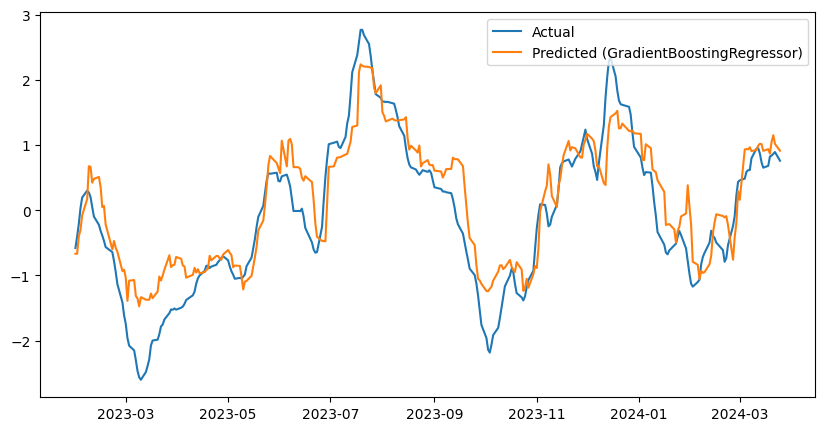

array([-0.66851664, -0.66851664, -0.40253187, -0.30302973, -0.07990888,
        0.17172446,  0.67432996,  0.66424211,  0.42152873,  0.48014441,
        0.50967504,  0.35800387,  0.04593644,  0.06522603, -0.21882018,
       -0.60219746, -0.47242232, -0.57554622, -0.63905246, -0.93355629,
       -0.91350062, -1.03734535, -1.39104797, -1.08127687, -1.07147029,
       -1.31605141, -1.35350116, -1.47592445, -1.33394701, -1.3726777 ,
       -1.37434105, -1.3727994 , -1.27814124, -1.34885572, -1.24817741,
       -1.01776748, -1.07928723, -1.00252234, -0.91486076, -0.69110518,
       -0.87260799, -0.84468817, -0.83767928, -0.71765098, -0.74510237,
       -0.84835907, -0.86262627, -1.03492241, -0.99158264, -0.88492091,
       -0.95663629, -0.90520787, -0.96707863, -0.95012412, -0.91741971,
       -0.89928622, -0.69884371, -0.76941512, -0.7021982 , -0.70307864,
       -0.74047169, -0.75994686, -0.68030636, -0.61130961, -0.65632959,
       -0.68845757, -0.87535955, -0.84934231, -0.85435378, -1.01

In [26]:
# ---- Model Training ----

from lightgbm import LGBMRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')   
base_models = [
    LinearRegression(),
    GradientBoostingRegressor(random_state=42),
    LGBMRegressor(random_state=42, verbose=-1),
    # SGDRegressor(random_state=42),
    RandomForestRegressor(n_estimators=100, random_state=42),
    SVR(),
    KNeighborsRegressor(),
    
]

for model in base_models:
    y_pred = train(model, X_train, y_train, X_test, y_test, model_results, plot=False)


model_reg = LinearRegression()
train(model_reg, X_train, y_train, X_test, y_test, model_results, plot=True)


model_gbm = GradientBoostingRegressor(n_estimators=100, random_state=42)
train(model_gbm, X_train, y_train, X_test, y_test, model_results)

In [142]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional, Dropout
def calculate_padding(features, look_back):
    return (look_back - (features % look_back)) % look_back
pair_df, X_train, y_train, X_test, y_test = build_configuration(selected_config)
LOOK_BACK = 2
padding_train = calculate_padding(X_train.shape[1], LOOK_BACK)
padding_test = calculate_padding(X_test.shape[1], LOOK_BACK)

# Pad both training and testing feature sets
X_train_padded = np.pad(X_train.values, ((0, 0), (0, padding_train)), 'constant', constant_values=0)
X_test_padded = np.pad(X_test.values, ((0, 0), (0, padding_test)), 'constant', constant_values=0)

# Reshape both sets for LSTM
X_train_lstm = X_train_padded.reshape((X_train.shape[0], LOOK_BACK, -1))
X_test_lstm = X_test_padded.reshape((X_test.shape[0], LOOK_BACK, -1))


# Build the LSTM model
model_lstm = Sequential([
    LSTM(200, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
    Dropout(0.1),
    LSTM(200),
    Dense(1)
])

model_lstm.compile(optimizer='adam', loss='mse')

# Fit the model
model_lstm.fit(X_train_lstm, y_train, epochs=200, verbose=1)

# Predict
y_pred_lstm = model_lstm.predict(X_test_lstm)

calculate_metrics(y_test, y_pred_lstm.flatten())





------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     451  2023-01-12
Val       150  2023-08-22
Test      152  2023-08-18
Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - loss: 0.9396
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6492
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5205
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4453
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3746
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4340
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2838
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3085
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2475
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2434
Epoch 11/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2536
Epoch 12/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2366
Epoch 13/200
15/15 ━━━━━━━━━━━━━━━━━

{'mape': 2.6437635881403074,
 'mse': 1.2278331980839192,
 'mae': 0.8876197477555682,
 'r2': -0.3612764615989106}

In [145]:
pd.DataFrame(X_train).to_csv("X_train_lstm.csv")

Epoch 1/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 1.3300
Epoch 2/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7779
Epoch 3/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6459
Epoch 4/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4465
Epoch 5/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3095
Epoch 6/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3177
Epoch 7/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2386
Epoch 8/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2548
Epoch 9/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2037
Epoch 10/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1778
Epoch 11/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1605
Epoch 12/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1758
Epoch 13/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1757
Epoch 14/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1814
Epoch 15/200
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.1957
Epoc

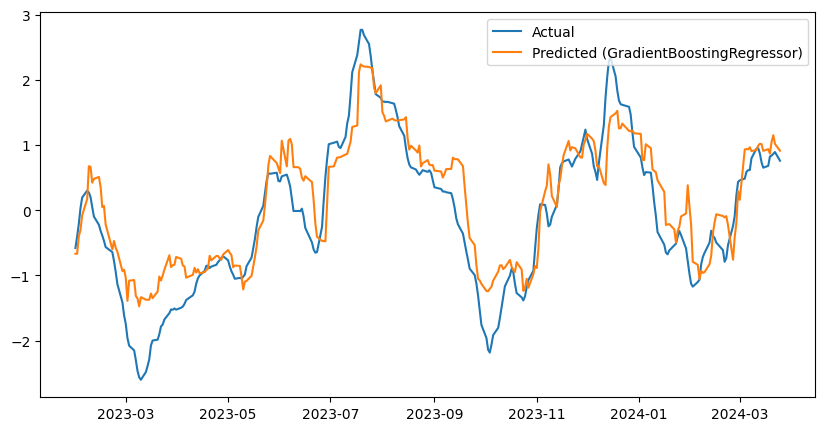

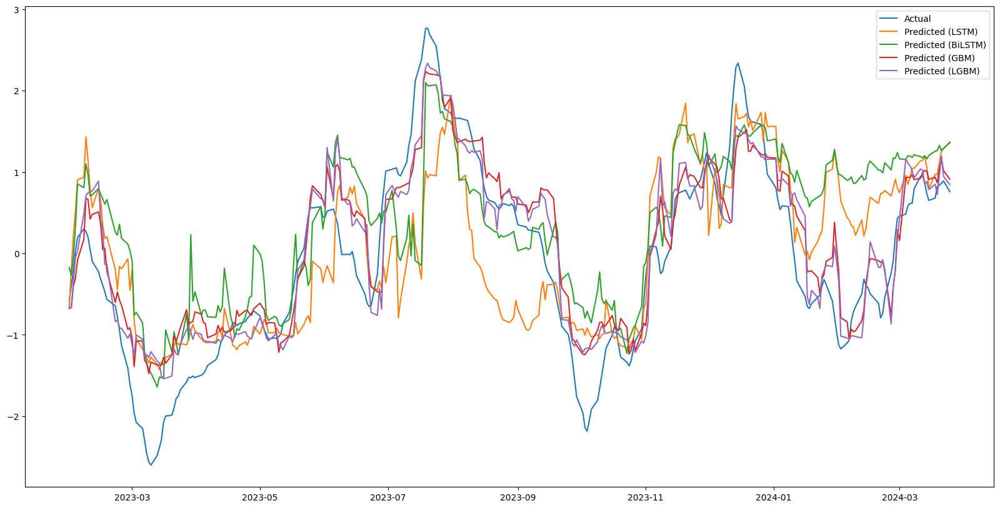

In [29]:
model_bilstm = Sequential([
        Bidirectional(LSTM(70, return_sequences=True), input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
        Dropout(0.2),  # Dropout for regularizing and preventing overfitting
        Bidirectional(LSTM(50, return_sequences=True)),
        Dropout(0.2),
        Bidirectional(LSTM(50)),
        Dense(1)  # Output layer
    ])

model_bilstm.compile(optimizer='adam', loss='mse')

# Fit the model
model_bilstm.fit(X_train_lstm, y_train, epochs=200, verbose=1)

# Predict
y_pred_bilstm = model_bilstm.predict(X_test_lstm)

# Evaluate
calculate_metrics(y_test, y_pred_bilstm.flatten())

# Plot actual vs. predicted values



base_models = [
    LinearRegression(),
    GradientBoostingRegressor(random_state=42),
    LGBMRegressor(random_state=42, verbose=-1),
    # SGDRegressor(random_state=42),
    RandomForestRegressor(n_estimators=100, random_state=42),
    SVR(),
    KNeighborsRegressor(),
    
]
y_preds_dict = {}
for model in base_models:
    y_pred = train(model, X_train, y_train, X_test, y_test, model_results, plot=False)
    y_preds_dict[model.__class__.__name__] = y_pred

model_reg = LinearRegression()
train(model_reg, X_train, y_train, X_test, y_test, model_results, plot=False)


model_gbm = GradientBoostingRegressor(n_estimators=100, random_state=42)
train(model_gbm, X_train, y_train, X_test, y_test, model_results)

fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(y_test.index, y_test, label="Actual")
ax.plot(y_test.index, y_pred_lstm, label="Predicted (LSTM)")
ax.plot(y_test.index, y_pred_bilstm, label="Predicted (BiLSTM)")
#GradientBoostingRegressor
ax.plot(y_test.index, y_preds_dict['GradientBoostingRegressor'], label="Predicted (GBM)")
ax.plot(y_test.index, y_preds_dict['LGBMRegressor'], label="Predicted (LGBM)")

ax.legend()
plt.show()


In [31]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.6 MB/s eta 0:00:00a 0:00:01


In [39]:
## Hyperparameter tuning for LSTM, BiLSTM, RNN

import keras_tuner as kt
from tensorflow import keras    
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=50, max_value=200, step=50),
                   return_sequences=True, input_shape=(LOOK_BACK, X_train_lstm.shape[2])))
    model.add(Dropout(rate=hp.Float('dropout_1', min_value=0.0, max_value=0.2, step=0.1)))
    model.add(LSTM(units=hp.Int('units', min_value=50, max_value=200, step=50)))
    model.add(Dense(1))
    model.compile(optimizer=keras.optimizers.Adam(hp.Float('learning_rate', 1e-4, 1e-1, sampling='LOG')),
                  loss='mse')
    return model

tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=20,  # number of model configurations to try
    executions_per_trial=1,  # number of models that should be built and fit for each trial

    project_name='lstm_tuning'
)

tuner.search(X_train_lstm, y_train, epochs=200, validation_split=0.2, verbose=0)
best_model = tuner.get_best_models(num_models=1)[0]


Reloading Tuner from ./lstm_tuning/tuner0.json


In [41]:
print(best_model.summary())
print(tuner.results_summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 3, 50)          │        32,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 3, 50)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 50)             │        20,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 52,851 (206.45 KB)

 Trainable params: 52,851 (206.45 KB)

 Non-trainable params: 0 (0.00 B)

None
Results summary
Results in ./lstm_tuning
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 16 summary
Hyperparameters:
units: 50
dropout_1: 0.1
learning_rate: 0.02165185929701211
Score: 0.9715739488601685

Trial 04 summary
Hyperparameters:
units: 200
dropout_1: 0.0
learning_rate: 0.021720624510856296
Score: 0.9955245852470398

Trial 02 summary
Hyperparameters:
units: 200
dropout_1: 0.0
learning_rate: 0.033511793625188954
Score: 1.039779543876648

Trial 11 summary
Hyperparameters:
units: 50
dropout_1: 0.0
learning_rate: 0.0032626007343494624
Score: 1.0605387687683105

Trial 07 summary
Hyperparameters:
units: 50
dropout_1: 0.1
learning_rate: 0.00038827848968887515
Score: 1.070475459098816

Trial 05 summary
Hyperparameters:
units: 100
dropout_1: 0.2
learning_rate: 0.0019152928071079563
Score: 1.0730408430099487

Trial 09 summary
Hyperparameters:
units: 100
dropout_1: 0.2
learning_rate: 0.04818160436963496
Score: 1.0766445398330688

Trial 19 summary
Hyperparame

In [45]:
y_pred_best = best_model.predict(X_test_lstm)
calculate_metrics(y_test, y_pred_best.flatten())



10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

R2: -0.25, MAE: 1.00, MAPE: 250.44%


In [61]:
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Bidirectional, Dropout

def build_bilstm_model(hp):
    model = Sequential([
        Bidirectional(
            LSTM(
                units=hp.Int('units1', min_value=30, max_value=100, step=10),
                return_sequences=True
            ),
            input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])
        ),
        Dropout(hp.Float('dropout1', min_value=0, max_value=0.5, step=0.1)),
        Bidirectional(
            LSTM(
                units=hp.Int('units2', min_value=30, max_value=100, step=10),
                return_sequences=True,
            )
        ),
        Dropout(hp.Float('dropout2', min_value=0, max_value=0.5, step=0.1)),
        Bidirectional(
            LSTM(units=hp.Int('units3', min_value=30, max_value=100, step=10))
        ),
        Dense(1)
    ])

    model.compile(
        optimizer='adam',
        loss='mse'
    )
    return model


In [64]:
tuner = kt.RandomSearch(
    build_bilstm_model,
    objective='val_loss',
    max_trials=30,  # Number of different configurations to try
    executions_per_trial=1,  # Number of models to train per trial

    project_name='bilstm_tuning'
)


In [59]:
tuner.search(
    X_train_lstm, y_train,
    epochs=200,  
    validation_split=0.2,  # Use part of the training data for vali#dation
    verbose=0
)


In [60]:
print(tuner.results_summary())  

Results summary
Results in my_dir/bilstm_tuning
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 19 summary
Hyperparameters:
units1: 30
dropout1: 0.0
units2: 40
dropout2: 0.1
units3: 90
Score: 0.8883605599403381

Trial 23 summary
Hyperparameters:
units1: 50
dropout1: 0.1
units2: 50
dropout2: 0.30000000000000004
units3: 90
Score: 0.9969940185546875

Trial 09 summary
Hyperparameters:
units1: 100
dropout1: 0.30000000000000004
units2: 70
dropout2: 0.30000000000000004
units3: 90
Score: 0.9988906979560852

Trial 14 summary
Hyperparameters:
units1: 30
dropout1: 0.4
units2: 70
dropout2: 0.2
units3: 100
Score: 1.0549407005310059

Trial 13 summary
Hyperparameters:
units1: 70
dropout1: 0.30000000000000004
units2: 60
dropout2: 0.0
units3: 50
Score: 1.0649733543395996

Trial 02 summary
Hyperparameters:
units1: 80
dropout1: 0.4
units2: 100
dropout2: 0.4
units3: 100
Score: 1.0795093774795532

Trial 15 summary
Hyperparameters:
units1: 100
dropout1: 0.1
units2: 60
dropout2: 0.3

In [57]:
best_bilstm_model = tuner.get_best_models(num_models=1)[0]

# Predict
y_pred_bilstm = best_bilstm_model.predict(X_test_lstm)

# Evaluate
calculate_metrics(y_test, y_pred_bilstm.flatten())


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

R2: -0.04, MAE: 0.94, MAPE: 292.97%


## Grid search for Lookback


In [78]:
%matplotlib inline 




%matplotlib inline
import itertools

# Define parameter ranges
MA_HIGH = [60, 45]  
MA_LOW = [3, 5]
LOOK_BACK = [1,2, 3, 5, 7]

# List to store model results for comparison
results = []

# Iterate over all combinations of parameters
for ma_high, ma_low, look_back in itertools.product(MA_HIGH, MA_LOW, LOOK_BACK):
    selected_config = {
        'PAIR_IDX': 15,  
        'ADD_SENTIMENT_MA': True,
        'SPREAD_WINDOW': None,
        'MA_HIGH': ma_high,
        'MA_LOW': ma_low,
        'LOOK_BACK': look_back,
        'DROP_COLS': []
    }

    # Build the model configuration
    pair_df, X_train, y_train, X_test, y_test = build_configuration(selected_config)
    print("Number of features:", X_train.shape[1])
    print(f"Config: MA_HIGH={ma_high}, MA_LOW={ma_low}, LOOK_BACK={look_back}")
    
    # padding
    padding_train = calculate_padding(X_train.shape[1], look_back)
    padding_test = calculate_padding(X_test.shape[1], look_back)
    X_train_padded = np.pad(X_train.values, ((0, 0), (0, padding_train)), 'constant', constant_values=0)
    X_test_padded = np.pad(X_test.values, ((0, 0), (0, padding_test)), 'constant', constant_values=0)
    X_train_lstm = X_train_padded.reshape((X_train.shape[0], look_back, -1))
    X_test_lstm = X_test_padded.reshape((X_test.shape[0], look_back, -1))
    
    

    # Train your model here (using your preferred LSTM setup)
    model_lstm = Sequential([
        LSTM(200, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
        Dropout(0.1),
        LSTM(200),
        Dense(1)
    ])
    # Evaluate your model
    model_lstm.compile(optimizer='adam', loss='mse')    
    model_lstm.fit(X_train_lstm, y_train, epochs=150, verbose=0)
    y_pred_lstm = model_lstm.predict(X_test_lstm)   
    metrics = calculate_metrics(y_test, y_pred_lstm.flatten())

    results.append({
        'ma_high': ma_high,
        'ma_low': ma_low,
        'look_back': look_back,
        'mape': metrics['mape'],
        'mse': metrics['mse'],
        'mae': metrics['mae'],
        'r2': metrics['r2'],
    })
    print(f"Metrics: {metrics}")

results_df = pd.DataFrame(results)




------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     436  2023-01-31
Val        72  2023-12-13
Test      219  2023-05-15
Number of features: 334
Config: MA_HIGH=60, MA_LOW=3, LOOK_BACK=1
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

R2: 0.13, MAE: 0.93, MAPE: 162.11%
Metrics: {'mape': 1.6210858747726993, 'mse': 1.3145701668001726, 'mae': 0.9335187484585001, 'r2': 0.13352855215316883}

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     435  2023-01-30
Val        72  2023-12-12
Test      219  2023-05-12
Number of features: 334
Config: MA_HIGH=60, MA_LOW=3, LOOK_BACK=2
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

R2: 0.40, MAE: 0.75, MAPE: 143.19%
Metrics: {'mape': 1.431869840849787, 'mse': 0.915360562816443, 'mae': 0.7502690640747366, 'r2': 0.3966592182020683}

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     435  2023-01-30
Val        72  2023-12-11
Test  

Config: MA_HIGH=60, MA_LOW=5, LOOK_BACK=3 

In [82]:
results_df = results_df.sort_values('r2', ascending=False)
results_df.head(10)

,ma_high,ma_low,look_back,mape,mse,mae,r2
16,45,5,2,1.718557,0.607157,0.647037,0.554294
11,45,3,2,1.968429,0.827653,0.714690,0.478217
6,60,5,2,1.435257,0.770194,0.695476,0.421902
1,60,3,2,1.431870,0.915361,0.750269,0.396659
7,60,5,3,1.873648,0.811418,0.758241,0.392481
17,45,5,3,2.227257,0.903241,0.774124,0.339058
2,60,3,3,1.996801,1.072334,0.857129,0.295111
12,45,3,3,1.334849,1.230106,0.884176,0.227049
8,60,5,5,1.501681,1.142857,0.837105,0.144328
5,60,5,1,1.313454,1.147970,0.863418,0.138349


In [148]:
# RESULT TO PICKLE
X_test_datasets = {}
#pickle the partial results
import pickle
for p in range(30):
    model_results = {}
    selected_config = {
            'PAIR_IDX': p,  
            'ADD_SENTIMENT_MA': True,
            'SPREAD_WINDOW': None,
            'MA_HIGH': 45,
            'MA_LOW': 5,
            'LOOK_BACK': 2,
            'DROP_COLS': []
        }

    # Build the model configuration
    pair_df, X_train, y_train, X_test, y_test = build_configuration(selected_config) 
    X_test_datasets[f"X_train_pair_{p}"] = X_test
    
# Serialize the dictionary to a pickle file
with open('X_test_datasets_lstm.pickle', 'wb') as handle:
    pickle.dump(X_test_datasets, handle)



------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     457  2023-01-06
Val       152  2023-08-18
Test      154  2023-08-16

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     457  2023-01-06
Val       152  2023-08-18
Test      154  2023-08-16

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     435  2023-01-30
Val       145  2023-08-29
Test      146  2023-08-28

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     385  2023-03-20
Val       128  2023-09-22
Test      129  2023-09-21

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     457  2023-01-06
Val       152  2023-08-18
Test      154  2023-08-16

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     457  2023-01-06
Val       152  2023-08-18
Test      154  2023-08-1


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.30, MAE: 0.60, MAPE: 432.93%

GradientBoostingRegressor

R2: 0.86, MAE: 0.28, MAPE: 279.66%

LGBMRegressor

R2: 0.86, MAE: 0.27, MAPE: 350.38%

RandomForestRegressor

R2: 0.83, MAE: 0.28, MAPE: 328.96%

SVR

R2: 0.30, MAE: 0.60, MAPE: 195.84%

KNeighborsRegressor

R2: -0.19, MAE: 0.81, MAPE: 587.28%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

R2: 0.18, MAE: 0.64, MAPE: 488.14%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 179ms/step

R2: -0.14, MAE: 0.75, MAPE: 579.25%


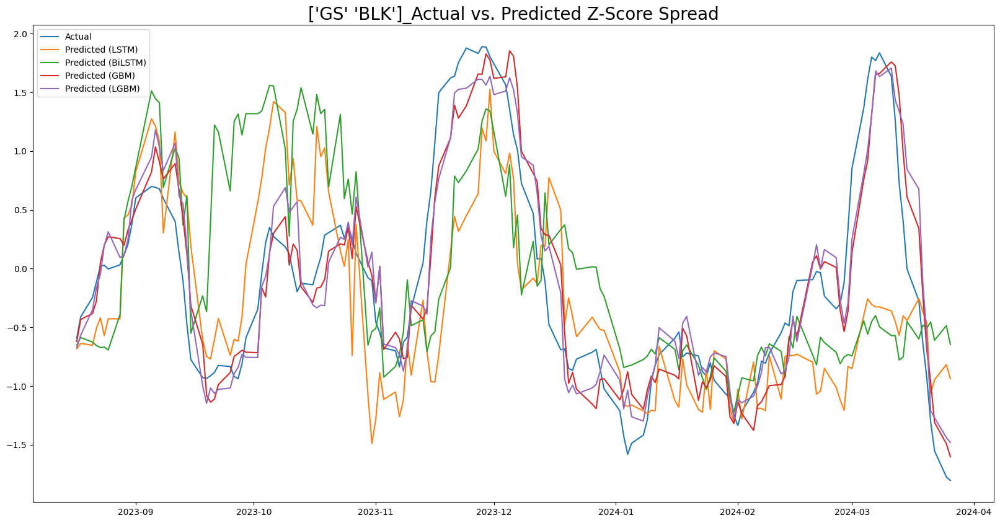


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -1.49, MAE: 1.06, MAPE: 519.30%

GradientBoostingRegressor

R2: 0.79, MAE: 0.31, MAPE: 194.81%

LGBMRegressor

R2: 0.82, MAE: 0.30, MAPE: 219.81%

RandomForestRegressor

R2: 0.82, MAE: 0.29, MAPE: 199.69%

SVR

R2: -1.97, MAE: 1.31, MAPE: 776.14%

KNeighborsRegressor

R2: -2.61, MAE: 1.46, MAPE: 844.38%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step

R2: -1.26, MAE: 1.12, MAPE: 534.12%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step

R2: -1.70, MAE: 1.19, MAPE: 574.99%


<Figure size 640x480 with 0 Axes>

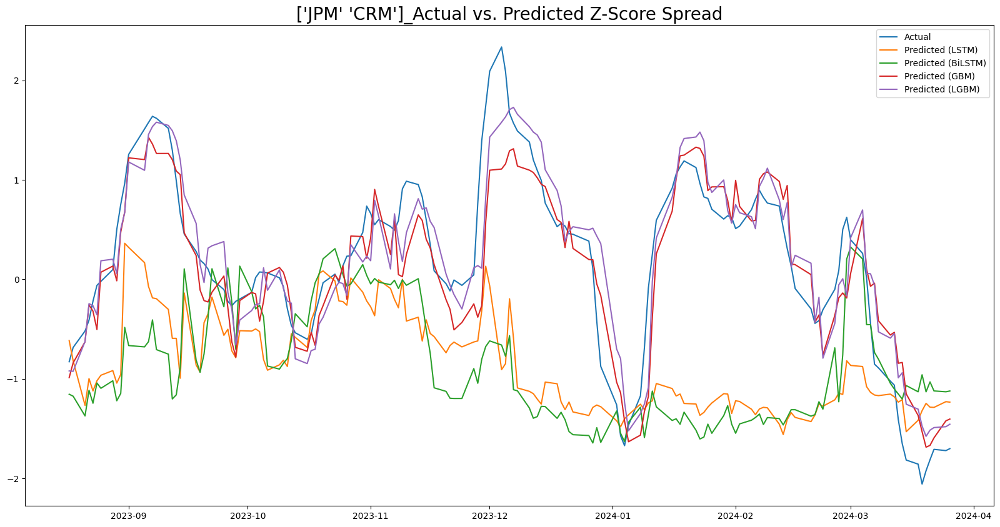


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: -0.57, MAE: 1.15, MAPE: 138.61%

GradientBoostingRegressor

R2: 0.89, MAE: 0.26, MAPE: 46.58%

LGBMRegressor

R2: 0.88, MAE: 0.29, MAPE: 49.76%

RandomForestRegressor

R2: 0.88, MAE: 0.28, MAPE: 49.51%

SVR

R2: -9.97, MAE: 3.45, MAPE: 455.99%

KNeighborsRegressor

R2: -1.70, MAE: 1.66, MAPE: 215.74%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step

R2: 0.21, MAE: 0.93, MAPE: 122.35%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 180ms/step

R2: 0.02, MAE: 1.02, MAPE: 126.83%


<Figure size 640x480 with 0 Axes>

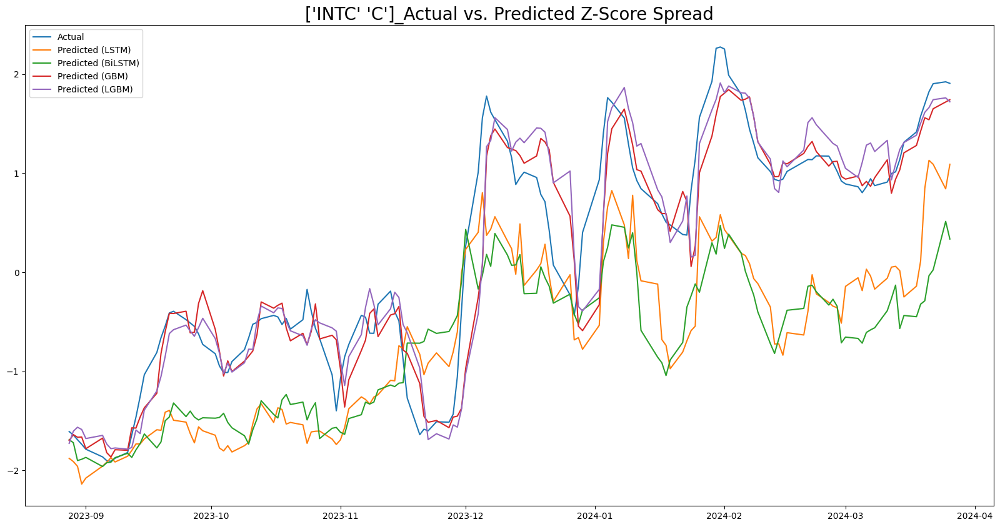


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     513  2023-09-21
Val        64  2023-12-22
Test       65  2023-12-21

LinearRegression

R2: 0.86, MAE: 0.38, MAPE: 141.56%

GradientBoostingRegressor

R2: 0.93, MAE: 0.24, MAPE: 55.46%

LGBMRegressor

R2: 0.92, MAE: 0.26, MAPE: 64.88%

RandomForestRegressor

R2: 0.92, MAE: 0.25, MAPE: 55.17%

SVR

R2: -0.01, MAE: 1.06, MAPE: 123.47%

KNeighborsRegressor

R2: -0.64, MAE: 1.29, MAPE: 279.81%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     513  2023-09-21
Val        64  2023-12-22
Test       65  2023-12-21
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step

R2: 0.35, MAE: 0.78, MAPE: 196.23%
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 185ms/step

R2: 0.08, MAE: 0.85, MAPE: 234.33%


<Figure size 640x480 with 0 Axes>

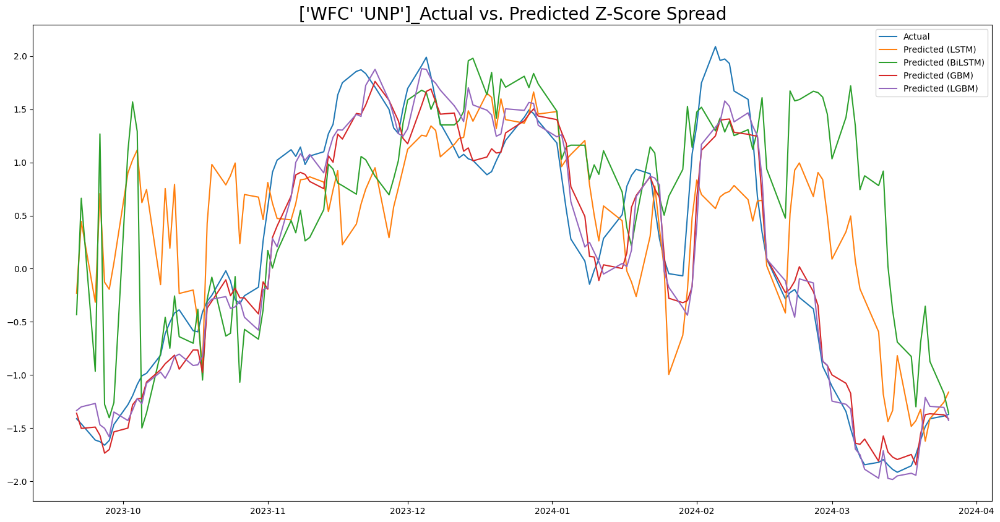


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.37, MAE: 0.68, MAPE: 446.39%

GradientBoostingRegressor

R2: 0.93, MAE: 0.21, MAPE: 58.00%

LGBMRegressor

R2: 0.92, MAE: 0.23, MAPE: 72.16%

RandomForestRegressor

R2: 0.92, MAE: 0.23, MAPE: 270.87%

SVR

R2: 0.51, MAE: 0.54, MAPE: 234.57%

KNeighborsRegressor

R2: 0.27, MAE: 0.67, MAPE: 977.31%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

R2: 0.60, MAE: 0.53, MAPE: 677.03%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 140ms/step

R2: 0.62, MAE: 0.48, MAPE: 777.02%


<Figure size 640x480 with 0 Axes>

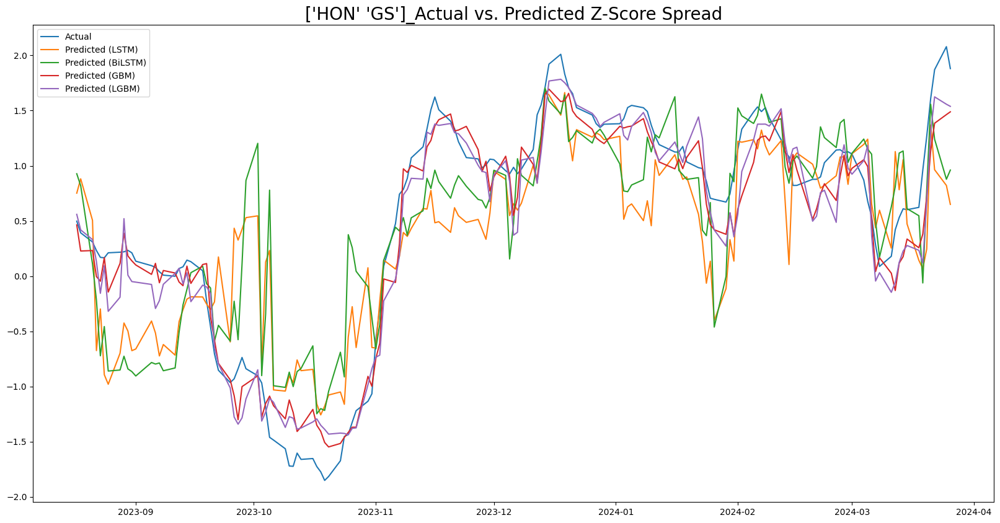


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -0.66, MAE: 1.15, MAPE: 170.64%

GradientBoostingRegressor

R2: 0.87, MAE: 0.29, MAPE: 57.54%

LGBMRegressor

R2: 0.85, MAE: 0.31, MAPE: 64.73%

RandomForestRegressor

R2: 0.87, MAE: 0.28, MAPE: 61.79%

SVR

R2: -0.04, MAE: 0.72, MAPE: 102.72%

KNeighborsRegressor

R2: -0.36, MAE: 0.87, MAPE: 114.24%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step

R2: -0.11, MAE: 0.78, MAPE: 147.47%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step

R2: -0.07, MAE: 0.74, MAPE: 146.02%


<Figure size 640x480 with 0 Axes>

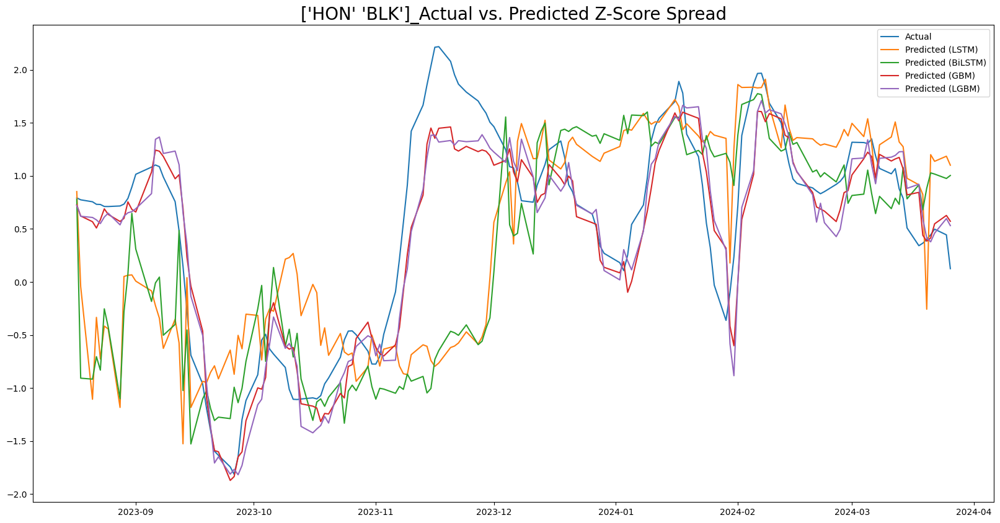


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -0.98, MAE: 1.44, MAPE: 411.20%

GradientBoostingRegressor

R2: 0.93, MAE: 0.22, MAPE: 55.62%

LGBMRegressor

R2: 0.93, MAE: 0.23, MAPE: 56.66%

RandomForestRegressor

R2: 0.94, MAE: 0.21, MAPE: 66.18%

SVR

R2: -0.38, MAE: 1.09, MAPE: 179.13%

KNeighborsRegressor

R2: -0.37, MAE: 1.03, MAPE: 270.57%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step

R2: 0.35, MAE: 0.75, MAPE: 175.00%
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 215ms/step

R2: 0.24, MAE: 0.79, MAPE: 180.34%


<Figure size 640x480 with 0 Axes>

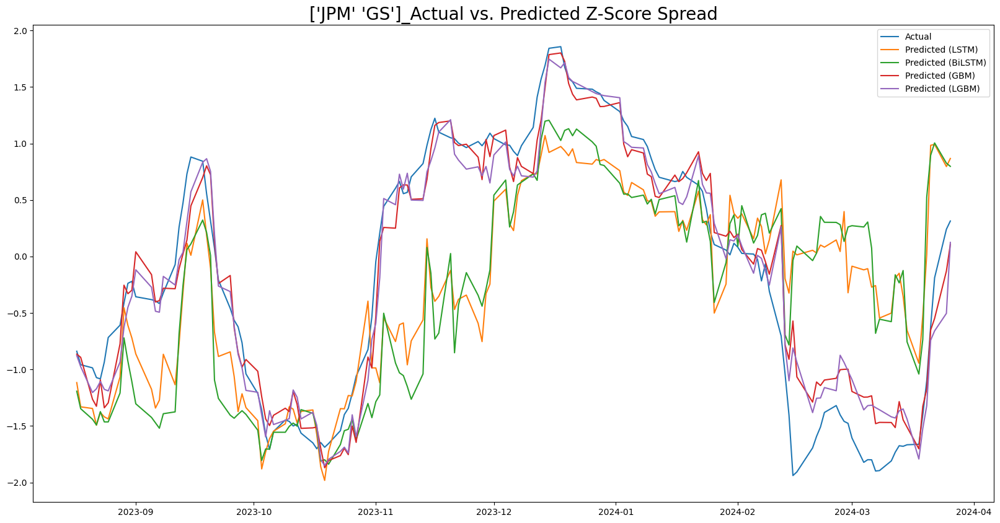


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     510  2023-09-22
Val        63  2023-12-26
Test       65  2023-12-21

LinearRegression

R2: -1.66, MAE: 1.64, MAPE: 2927.08%

GradientBoostingRegressor

R2: 0.89, MAE: 0.29, MAPE: 342.96%

LGBMRegressor

R2: 0.90, MAE: 0.27, MAPE: 418.74%

RandomForestRegressor

R2: 0.91, MAE: 0.27, MAPE: 608.82%

SVR

R2: -0.14, MAE: 1.01, MAPE: 1132.49%

KNeighborsRegressor

R2: -0.45, MAE: 1.11, MAPE: 1893.00%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     510  2023-09-22
Val        63  2023-12-26
Test       65  2023-12-21
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step  

R2: 0.51, MAE: 0.66, MAPE: 1453.82%
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step  

R2: 0.58, MAE: 0.62, MAPE: 1663.01%


<Figure size 640x480 with 0 Axes>

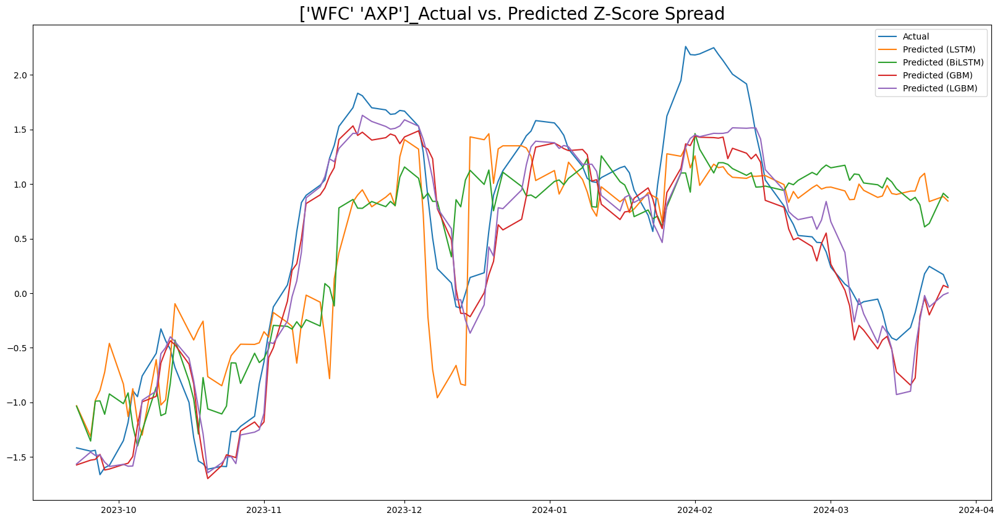


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: 0.69, MAE: 0.54, MAPE: 158.06%

GradientBoostingRegressor

R2: 0.94, MAE: 0.23, MAPE: 125.24%

LGBMRegressor

R2: 0.94, MAE: 0.21, MAPE: 108.97%

RandomForestRegressor

R2: 0.92, MAE: 0.25, MAPE: 148.00%

SVR

R2: -0.01, MAE: 1.02, MAPE: 187.29%

KNeighborsRegressor

R2: -0.23, MAE: 1.16, MAPE: 252.97%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step

R2: -0.42, MAE: 1.17, MAPE: 416.09%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step

R2: 0.25, MAE: 0.83, MAPE: 399.06%


<Figure size 640x480 with 0 Axes>

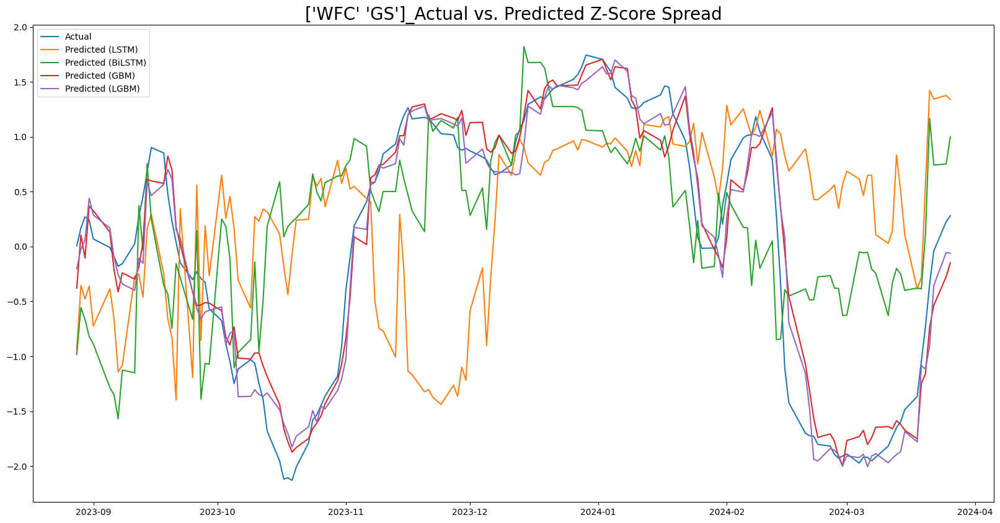


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: 0.48, MAE: 0.56, MAPE: 244.29%

GradientBoostingRegressor

R2: 0.84, MAE: 0.29, MAPE: 165.50%

LGBMRegressor

R2: 0.84, MAE: 0.28, MAPE: 277.01%

RandomForestRegressor

R2: 0.83, MAE: 0.29, MAPE: 317.40%

SVR

R2: -0.90, MAE: 1.14, MAPE: 529.73%

KNeighborsRegressor

R2: -1.08, MAE: 1.05, MAPE: 403.34%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step

R2: -0.31, MAE: 0.85, MAPE: 501.43%
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 269ms/step

R2: 0.16, MAE: 0.58, MAPE: 592.77%


<Figure size 640x480 with 0 Axes>

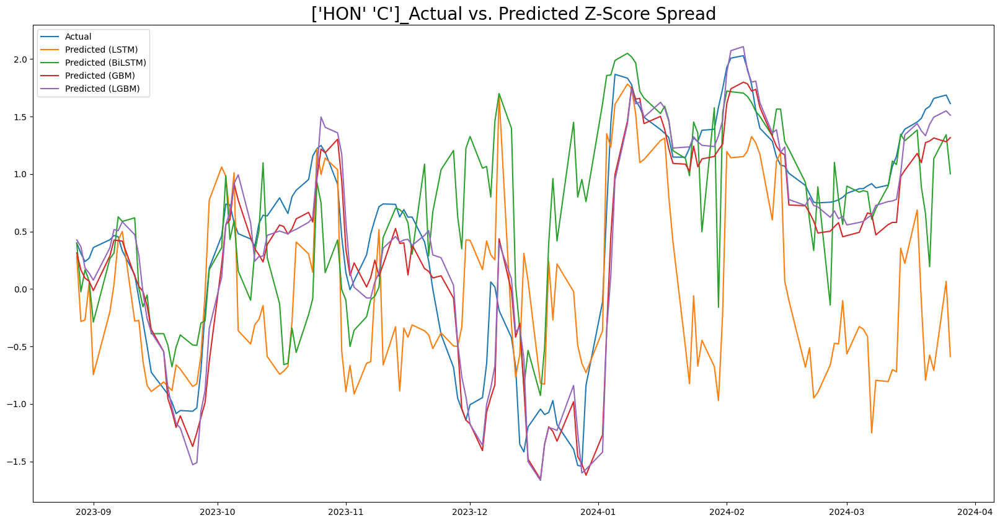


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: -1.33, MAE: 1.58, MAPE: 1590.40%

GradientBoostingRegressor

R2: 0.95, MAE: 0.21, MAPE: 230.14%

LGBMRegressor

R2: 0.94, MAE: 0.22, MAPE: 140.10%

RandomForestRegressor

R2: 0.92, MAE: 0.25, MAPE: 292.21%

SVR

R2: -0.10, MAE: 1.00, MAPE: 182.59%

KNeighborsRegressor

R2: -0.88, MAE: 1.29, MAPE: 529.22%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step

R2: 0.57, MAE: 0.60, MAPE: 390.80%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step

R2: 0.69, MAE: 0.50, MAPE: 289.46%


<Figure size 640x480 with 0 Axes>

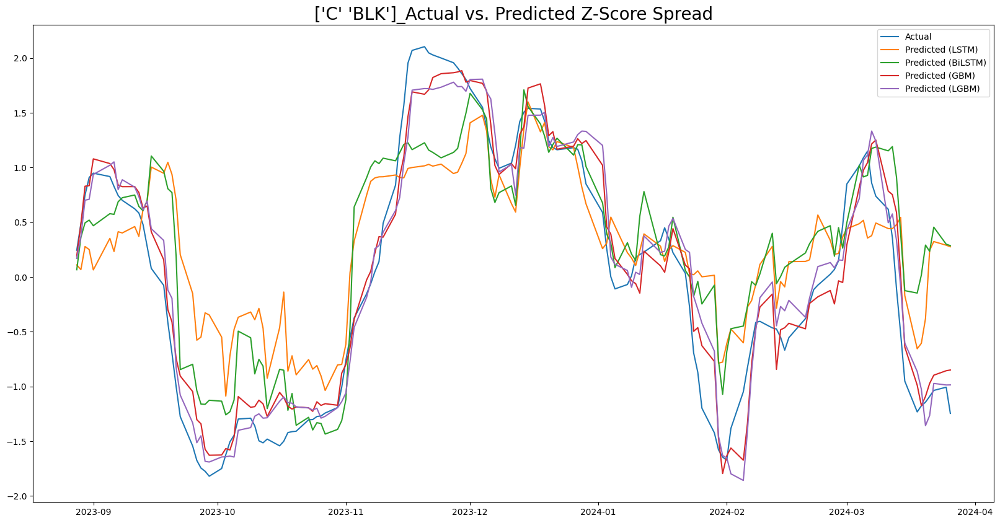


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     510  2023-09-22
Val        63  2023-12-26
Test       65  2023-12-21

LinearRegression

R2: 0.64, MAE: 0.44, MAPE: 117.75%

GradientBoostingRegressor

R2: 0.92, MAE: 0.21, MAPE: 34.44%

LGBMRegressor

R2: 0.92, MAE: 0.20, MAPE: 39.43%

RandomForestRegressor

R2: 0.91, MAE: 0.22, MAPE: 38.12%

SVR

R2: 0.58, MAE: 0.52, MAPE: 72.70%

KNeighborsRegressor

R2: -0.13, MAE: 0.88, MAPE: 118.44%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     510  2023-09-22
Val        63  2023-12-26
Test       65  2023-12-21
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step  

R2: 0.38, MAE: 0.55, MAPE: 119.48%
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step  

R2: 0.14, MAE: 0.72, MAPE: 106.40%


<Figure size 640x480 with 0 Axes>

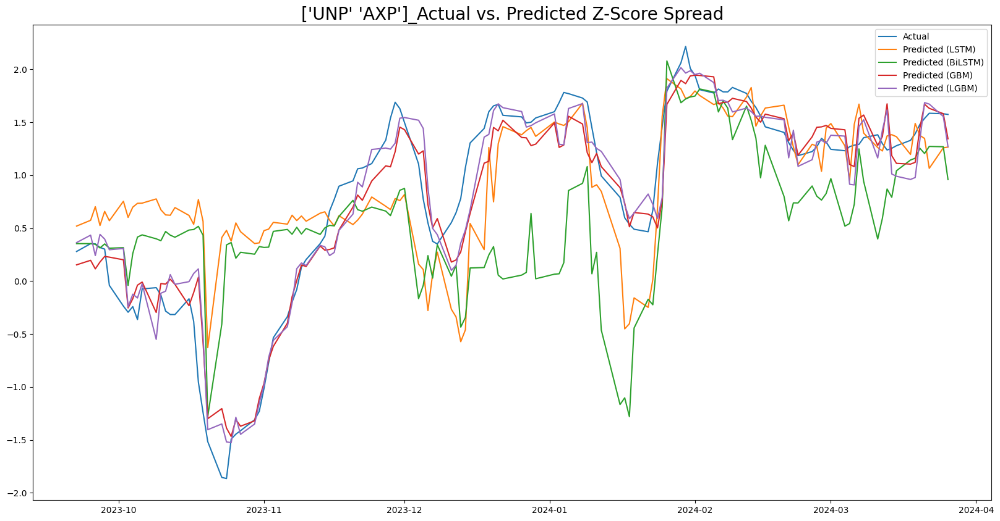


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: 0.08, MAE: 0.94, MAPE: 1122.52%

GradientBoostingRegressor

R2: 0.95, MAE: 0.20, MAPE: 211.37%

LGBMRegressor

R2: 0.95, MAE: 0.20, MAPE: 145.35%

RandomForestRegressor

R2: 0.96, MAE: 0.18, MAPE: 142.87%

SVR

R2: 0.05, MAE: 0.88, MAPE: 1105.75%

KNeighborsRegressor

R2: -0.42, MAE: 1.20, MAPE: 1112.55%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step

R2: 0.69, MAE: 0.51, MAPE: 1022.70%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step

R2: 0.71, MAE: 0.48, MAPE: 1022.47%


<Figure size 640x480 with 0 Axes>

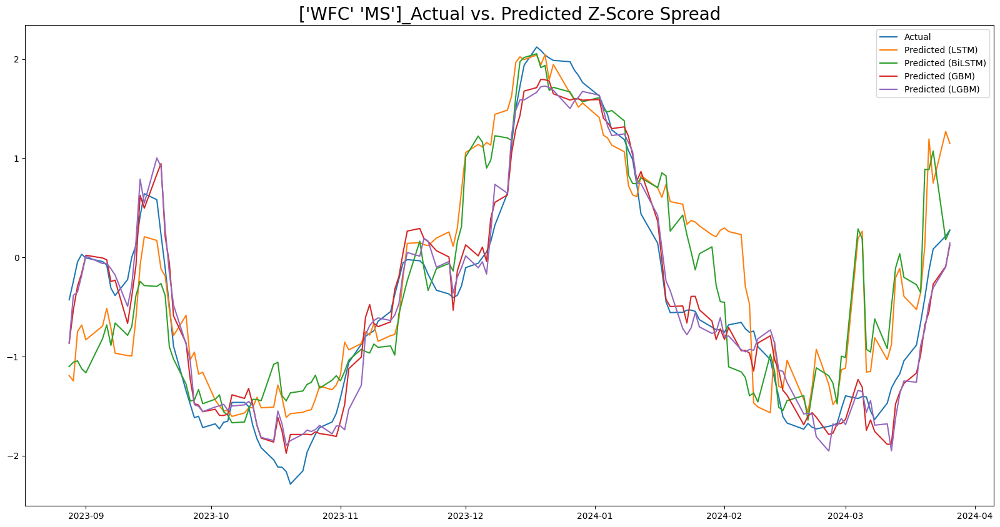


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     513  2023-09-21
Val        64  2023-12-22
Test       65  2023-12-21

LinearRegression

R2: -0.53, MAE: 1.19, MAPE: 308.53%

GradientBoostingRegressor

R2: 0.90, MAE: 0.24, MAPE: 95.42%

LGBMRegressor

R2: 0.91, MAE: 0.23, MAPE: 100.73%

RandomForestRegressor

R2: 0.90, MAE: 0.24, MAPE: 102.22%

SVR

R2: -0.13, MAE: 0.97, MAPE: 227.57%

KNeighborsRegressor

R2: 0.02, MAE: 0.85, MAPE: 200.64%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     513  2023-09-21
Val        64  2023-12-22
Test       65  2023-12-21
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step

R2: 0.43, MAE: 0.61, MAPE: 100.75%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step

R2: 0.54, MAE: 0.56, MAPE: 112.30%


<Figure size 640x480 with 0 Axes>

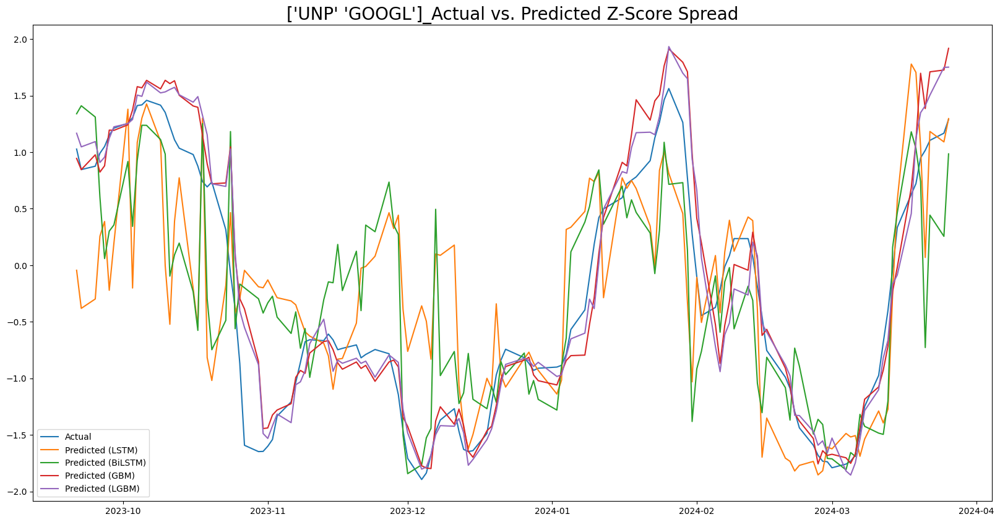


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -1.87, MAE: 1.82, MAPE: 321.98%

GradientBoostingRegressor

R2: 0.87, MAE: 0.32, MAPE: 61.91%

LGBMRegressor

R2: 0.86, MAE: 0.34, MAPE: 68.15%

RandomForestRegressor

R2: 0.86, MAE: 0.32, MAPE: 63.01%

SVR

R2: 0.03, MAE: 0.89, MAPE: 98.94%

KNeighborsRegressor

R2: -0.48, MAE: 1.18, MAPE: 195.51%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step

R2: 0.42, MAE: 0.73, MAPE: 117.47%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step

R2: 0.57, MAE: 0.63, MAPE: 102.21%


<Figure size 640x480 with 0 Axes>

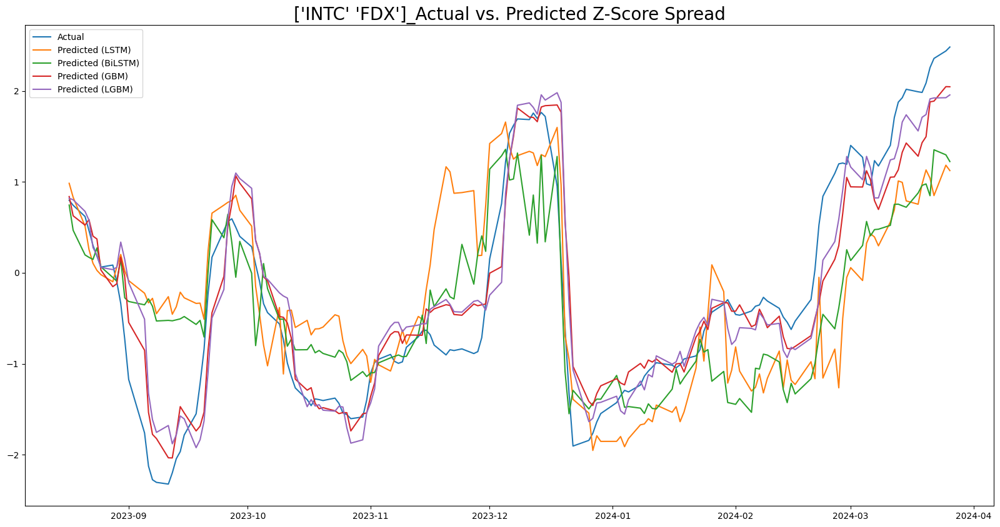


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: -0.06, MAE: 0.97, MAPE: 303.37%

GradientBoostingRegressor

R2: 0.82, MAE: 0.38, MAPE: 102.06%

LGBMRegressor

R2: 0.91, MAE: 0.26, MAPE: 76.12%

RandomForestRegressor

R2: 0.92, MAE: 0.25, MAPE: 46.89%

SVR

R2: -0.41, MAE: 1.09, MAPE: 249.71%

KNeighborsRegressor

R2: -0.10, MAE: 1.03, MAPE: 293.52%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step

R2: 0.17, MAE: 0.82, MAPE: 284.67%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step

R2: -0.03, MAE: 0.87, MAPE: 301.28%


<Figure size 640x480 with 0 Axes>

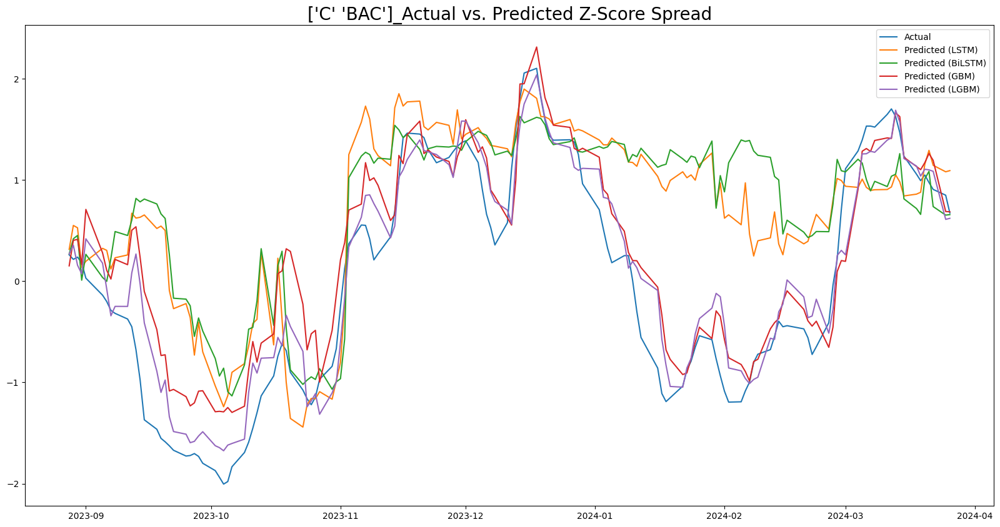


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -0.83, MAE: 1.14, MAPE: 242.30%

GradientBoostingRegressor

R2: 0.92, MAE: 0.24, MAPE: 67.38%

LGBMRegressor

R2: 0.92, MAE: 0.23, MAPE: 63.09%

RandomForestRegressor

R2: 0.91, MAE: 0.26, MAPE: 63.08%

SVR

R2: -1.22, MAE: 1.39, MAPE: 235.75%

KNeighborsRegressor

R2: -0.72, MAE: 1.27, MAPE: 178.07%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step

R2: 0.60, MAE: 0.57, MAPE: 97.38%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 134ms/step

R2: 0.71, MAE: 0.47, MAPE: 80.27%


<Figure size 640x480 with 0 Axes>

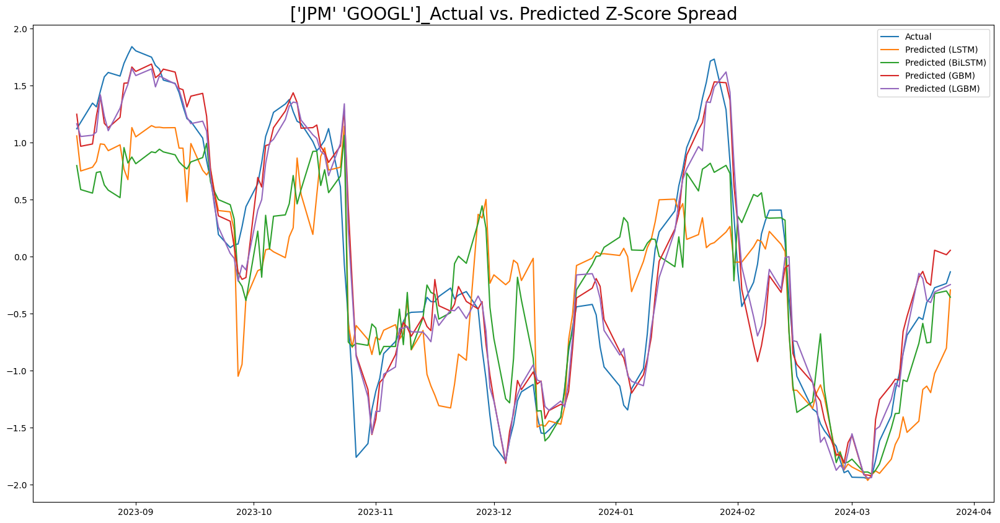


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.77, MAE: 0.51, MAPE: 61.30%

GradientBoostingRegressor

R2: 0.96, MAE: 0.18, MAPE: 26.56%

LGBMRegressor

R2: 0.96, MAE: 0.18, MAPE: 28.54%

RandomForestRegressor

R2: 0.96, MAE: 0.18, MAPE: 27.17%

SVR

R2: -0.73, MAE: 1.51, MAPE: 223.56%

KNeighborsRegressor

R2: 0.69, MAE: 0.57, MAPE: 85.99%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step

R2: 0.53, MAE: 0.61, MAPE: 72.54%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 172ms/step

R2: 0.69, MAE: 0.50, MAPE: 73.77%


<Figure size 640x480 with 0 Axes>

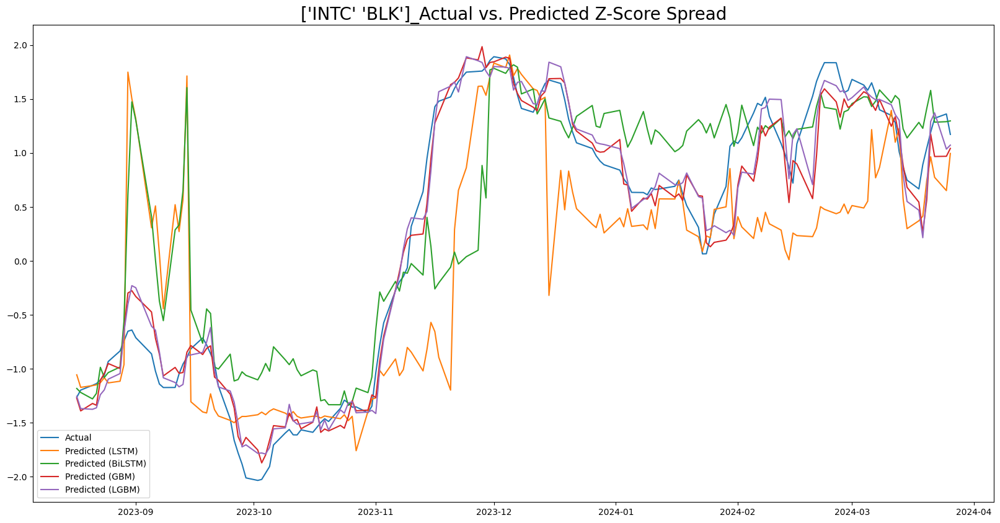


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.69, MAE: 0.40, MAPE: 92.38%

GradientBoostingRegressor

R2: 0.91, MAE: 0.22, MAPE: 68.69%

LGBMRegressor

R2: 0.89, MAE: 0.24, MAPE: 76.69%

RandomForestRegressor

R2: 0.89, MAE: 0.24, MAPE: 73.88%

SVR

R2: -0.37, MAE: 0.88, MAPE: 252.08%

KNeighborsRegressor

R2: -0.88, MAE: 1.04, MAPE: 246.98%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step

R2: 0.12, MAE: 0.72, MAPE: 208.53%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step

R2: 0.39, MAE: 0.58, MAPE: 123.90%


<Figure size 640x480 with 0 Axes>

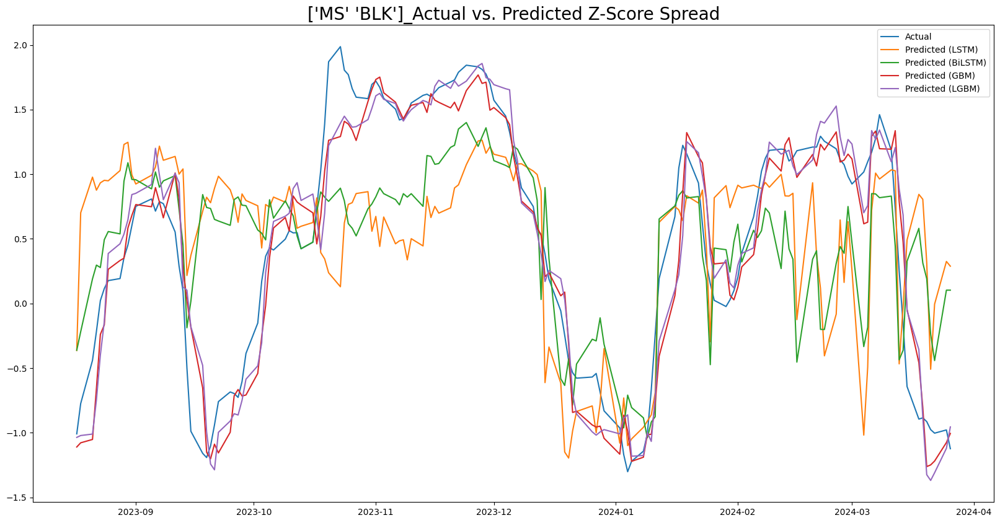


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -1.11, MAE: 0.89, MAPE: 2260.04%

GradientBoostingRegressor

R2: 0.68, MAE: 0.31, MAPE: 621.49%

LGBMRegressor

R2: 0.73, MAE: 0.29, MAPE: 539.84%

RandomForestRegressor

R2: 0.77, MAE: 0.27, MAPE: 563.10%

SVR

R2: -0.30, MAE: 0.68, MAPE: 1214.96%

KNeighborsRegressor

R2: -1.38, MAE: 0.95, MAPE: 1138.49%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step

R2: -0.43, MAE: 0.75, MAPE: 1285.19%
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step

R2: -0.90, MAE: 0.82, MAPE: 2125.30%


<Figure size 640x480 with 0 Axes>

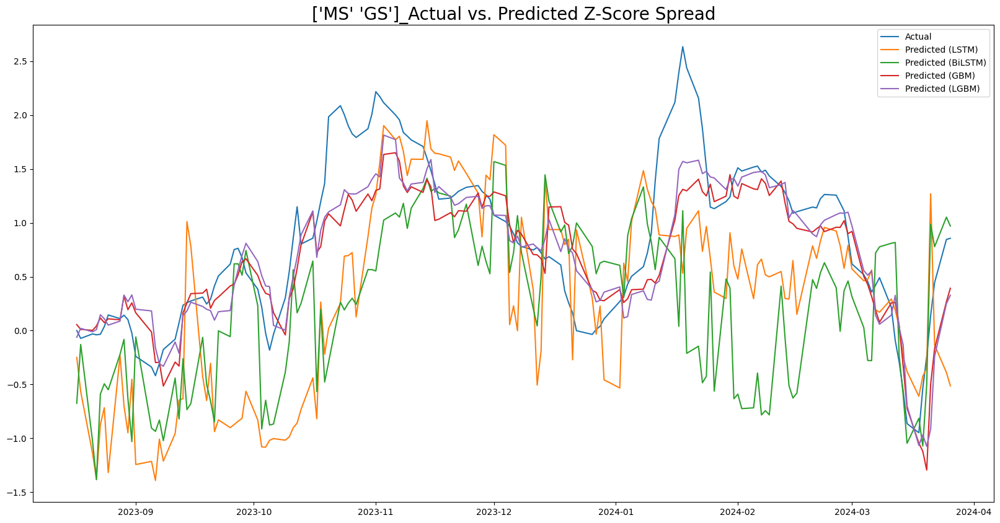


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.76, MAE: 0.44, MAPE: 97.39%

GradientBoostingRegressor

R2: 0.94, MAE: 0.21, MAPE: 61.63%

LGBMRegressor

R2: 0.94, MAE: 0.21, MAPE: 66.12%

RandomForestRegressor

R2: 0.93, MAE: 0.23, MAPE: 66.85%

SVR

R2: -1.14, MAE: 1.40, MAPE: 239.91%

KNeighborsRegressor

R2: -0.73, MAE: 1.25, MAPE: 195.80%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

R2: -0.34, MAE: 1.06, MAPE: 191.25%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step

R2: -0.82, MAE: 1.23, MAPE: 253.94%


<Figure size 640x480 with 0 Axes>

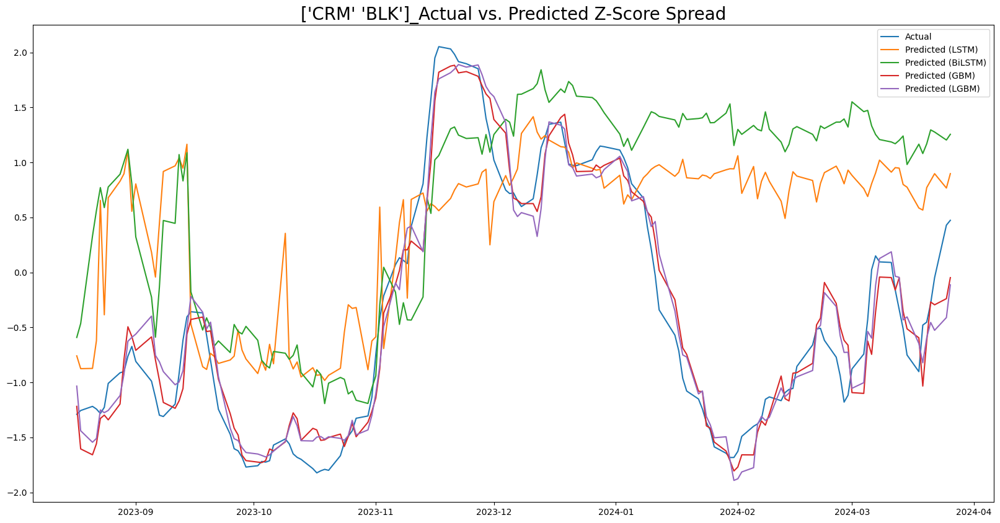


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -0.60, MAE: 1.05, MAPE: 511.35%

GradientBoostingRegressor

R2: 0.95, MAE: 0.20, MAPE: 107.97%

LGBMRegressor

R2: 0.93, MAE: 0.23, MAPE: 94.38%

RandomForestRegressor

R2: 0.92, MAE: 0.25, MAPE: 90.02%

SVR

R2: -0.95, MAE: 1.43, MAPE: 250.79%

KNeighborsRegressor

R2: -0.15, MAE: 1.07, MAPE: 221.44%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

R2: -0.14, MAE: 0.92, MAPE: 232.26%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step

R2: 0.54, MAE: 0.63, MAPE: 179.02%


<Figure size 640x480 with 0 Axes>

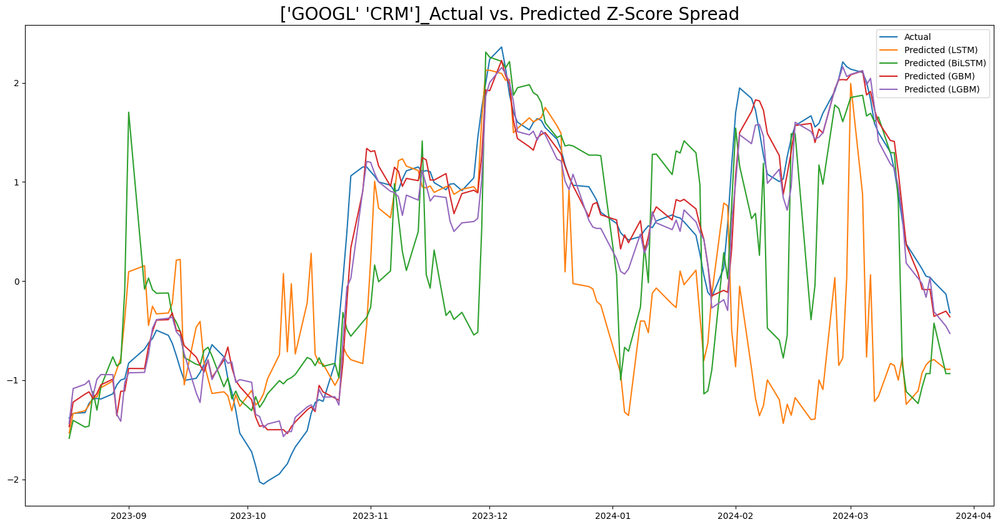


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.43, MAE: 0.62, MAPE: 2311.50%

GradientBoostingRegressor

R2: 0.92, MAE: 0.22, MAPE: 121.20%

LGBMRegressor

R2: 0.89, MAE: 0.25, MAPE: 266.92%

RandomForestRegressor

R2: 0.89, MAE: 0.25, MAPE: 135.64%

SVR

R2: -1.59, MAE: 1.40, MAPE: 3403.14%

KNeighborsRegressor

R2: -0.24, MAE: 0.93, MAPE: 1548.34%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

R2: 0.82, MAE: 0.32, MAPE: 943.27%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

R2: 0.47, MAE: 0.54, MAPE: 1002.35%


<Figure size 640x480 with 0 Axes>

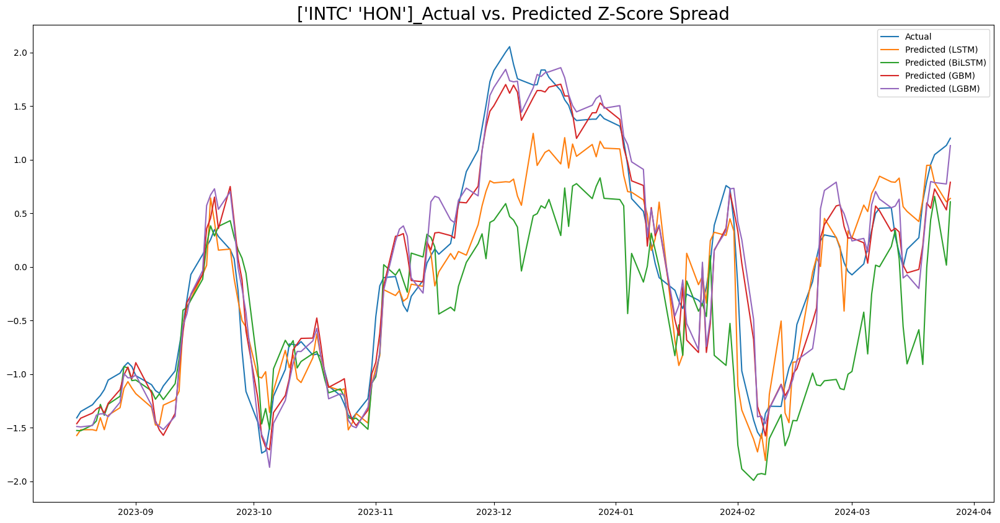


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     510  2023-09-22
Val        63  2023-12-26
Test       65  2023-12-21

LinearRegression

R2: 0.34, MAE: 0.85, MAPE: 144.95%

GradientBoostingRegressor

R2: 0.95, MAE: 0.19, MAPE: 30.85%

LGBMRegressor

R2: 0.93, MAE: 0.26, MAPE: 53.29%

RandomForestRegressor

R2: 0.94, MAE: 0.23, MAPE: 58.60%

SVR

R2: -0.48, MAE: 1.29, MAPE: 145.11%

KNeighborsRegressor

R2: -0.28, MAE: 1.13, MAPE: 207.11%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     510  2023-09-22
Val        63  2023-12-26
Test       65  2023-12-21
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  

R2: 0.65, MAE: 0.57, MAPE: 131.45%
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step  

R2: 0.61, MAE: 0.60, MAPE: 169.08%


<Figure size 640x480 with 0 Axes>

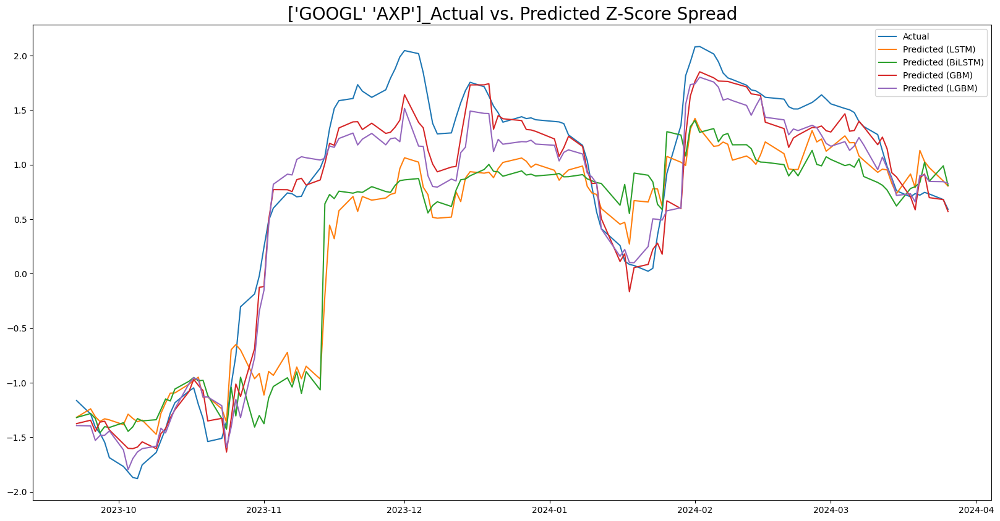


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08

LinearRegression

R2: -0.62, MAE: 1.34, MAPE: 362.54%

GradientBoostingRegressor

R2: 0.95, MAE: 0.18, MAPE: 97.37%

LGBMRegressor

R2: 0.95, MAE: 0.19, MAPE: 105.04%

RandomForestRegressor

R2: 0.95, MAE: 0.19, MAPE: 76.21%

SVR

R2: -0.39, MAE: 1.10, MAPE: 268.50%

KNeighborsRegressor

R2: -0.88, MAE: 1.24, MAPE: 212.29%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     580  2023-08-28
Val        72  2023-12-12
Test       74  2023-12-08
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

R2: 0.63, MAE: 0.57, MAPE: 185.22%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step

R2: 0.75, MAE: 0.43, MAPE: 240.72%


<Figure size 640x480 with 0 Axes>

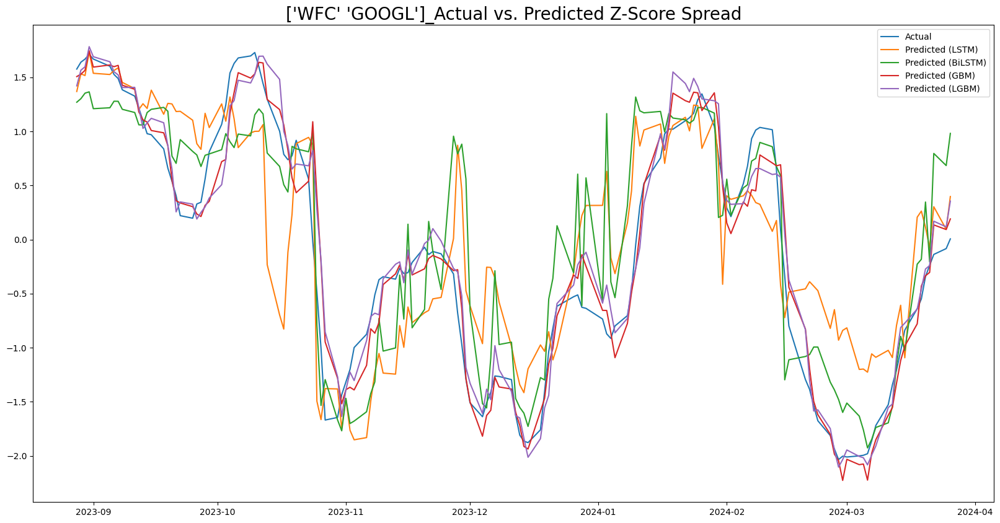


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.79, MAE: 0.44, MAPE: 75.75%

GradientBoostingRegressor

R2: 0.94, MAE: 0.21, MAPE: 53.85%

LGBMRegressor

R2: 0.94, MAE: 0.20, MAPE: 48.08%

RandomForestRegressor

R2: 0.95, MAE: 0.21, MAPE: 46.65%

SVR

R2: -1.66, MAE: 1.66, MAPE: 302.73%

KNeighborsRegressor

R2: -1.70, MAE: 1.58, MAPE: 307.18%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step

R2: 0.74, MAE: 0.48, MAPE: 111.40%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step

R2: 0.65, MAE: 0.57, MAPE: 162.38%


<Figure size 640x480 with 0 Axes>

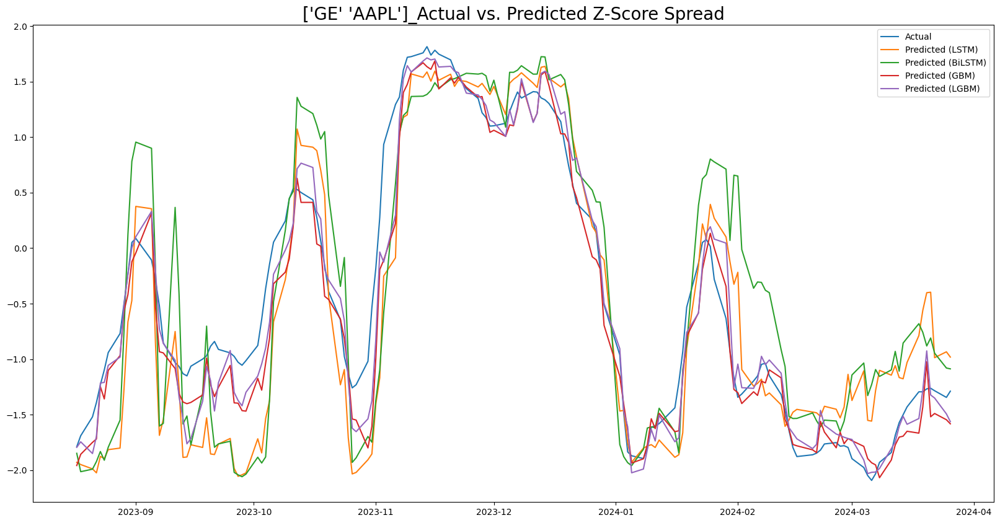


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.74, MAE: 0.52, MAPE: 155.10%

GradientBoostingRegressor

R2: 0.97, MAE: 0.17, MAPE: 85.46%

LGBMRegressor

R2: 0.96, MAE: 0.21, MAPE: 91.68%

RandomForestRegressor

R2: 0.96, MAE: 0.19, MAPE: 72.89%

SVR

R2: -0.13, MAE: 1.12, MAPE: 159.91%

KNeighborsRegressor

R2: -0.34, MAE: 1.24, MAPE: 347.95%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 138ms/step

R2: -0.15, MAE: 1.02, MAPE: 246.48%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step

R2: 0.40, MAE: 0.76, MAPE: 153.14%


<Figure size 640x480 with 0 Axes>

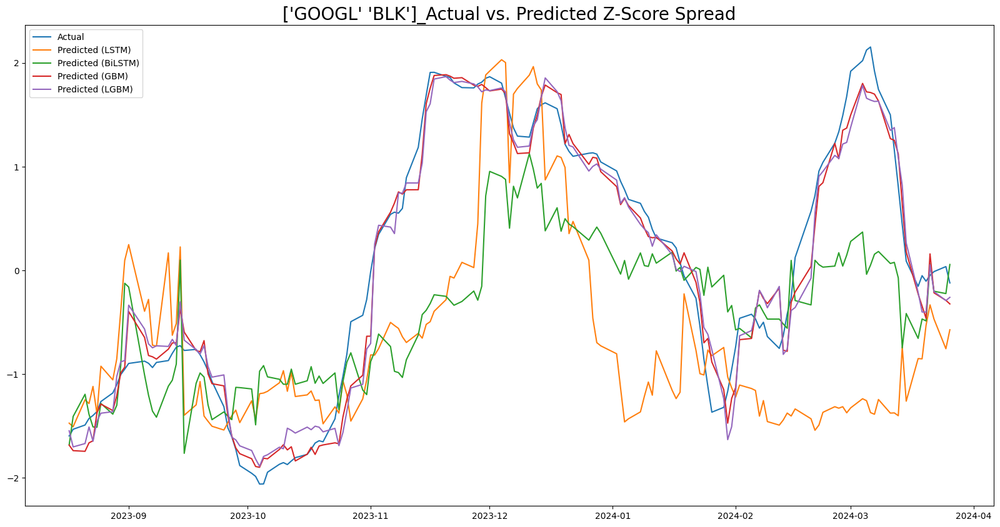


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: 0.75, MAE: 0.45, MAPE: 76.64%

GradientBoostingRegressor

R2: 0.87, MAE: 0.27, MAPE: 71.19%

LGBMRegressor

R2: 0.86, MAE: 0.27, MAPE: 63.31%

RandomForestRegressor

R2: 0.85, MAE: 0.28, MAPE: 77.63%

SVR

R2: -0.44, MAE: 1.09, MAPE: 224.62%

KNeighborsRegressor

R2: -1.60, MAE: 1.54, MAPE: 263.83%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step

R2: 0.04, MAE: 0.82, MAPE: 158.13%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step

R2: 0.51, MAE: 0.58, MAPE: 121.86%


<Figure size 640x480 with 0 Axes>

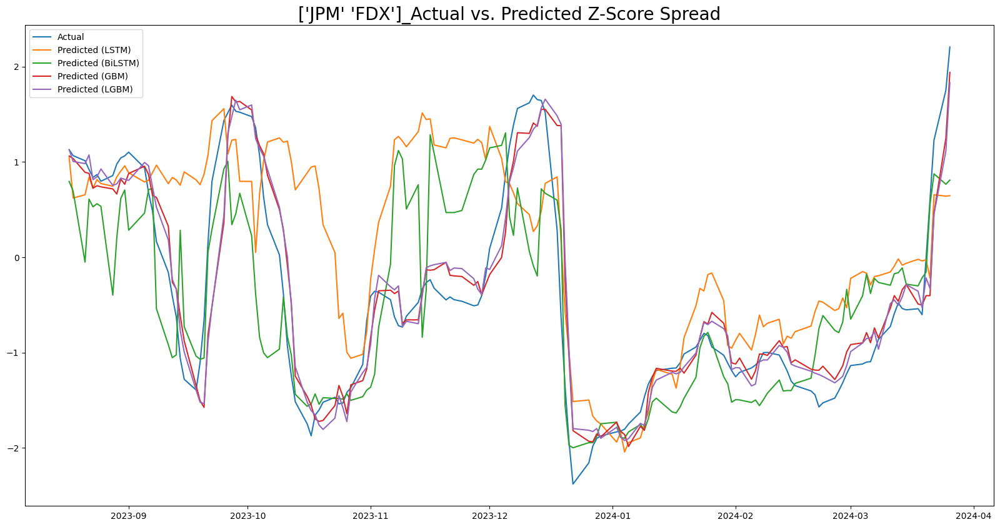


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -0.13, MAE: 0.88, MAPE: 389.10%

GradientBoostingRegressor

R2: 0.92, MAE: 0.23, MAPE: 89.56%

LGBMRegressor

R2: 0.93, MAE: 0.21, MAPE: 89.22%

RandomForestRegressor

R2: 0.93, MAE: 0.20, MAPE: 86.88%

SVR

R2: -0.72, MAE: 0.99, MAPE: 402.85%

KNeighborsRegressor

R2: -1.80, MAE: 1.30, MAPE: 488.85%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step

R2: 0.59, MAE: 0.51, MAPE: 157.61%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step

R2: 0.59, MAE: 0.52, MAPE: 197.81%


<Figure size 640x480 with 0 Axes>

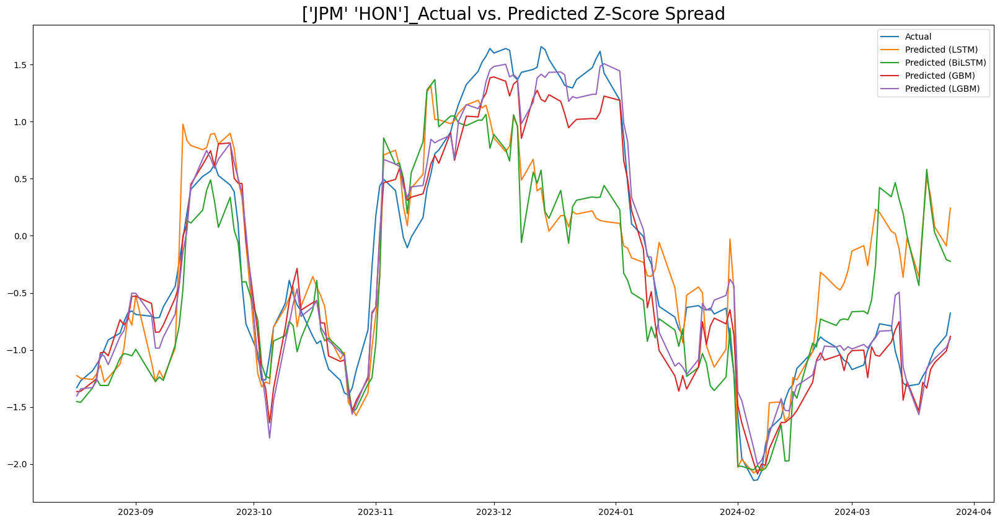


------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05

LinearRegression

R2: -0.57, MAE: 0.96, MAPE: 474.34%

GradientBoostingRegressor

R2: 0.84, MAE: 0.28, MAPE: 134.12%

LGBMRegressor

R2: 0.81, MAE: 0.30, MAPE: 114.95%

RandomForestRegressor

R2: 0.83, MAE: 0.30, MAPE: 155.41%

SVR

R2: -1.09, MAE: 1.06, MAPE: 235.67%

KNeighborsRegressor

R2: -1.91, MAE: 1.28, MAPE: 314.03%

------Dataset Information------
Set      Size  Date Cutoff
-----  ------  -------------
Train     610  2023-08-17
Val        76  2023-12-06
Test       77  2023-12-05
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

R2: -0.17, MAE: 0.74, MAPE: 221.68%
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step

R2: -0.35, MAE: 0.78, MAPE: 260.51%


<Figure size 640x480 with 0 Axes>

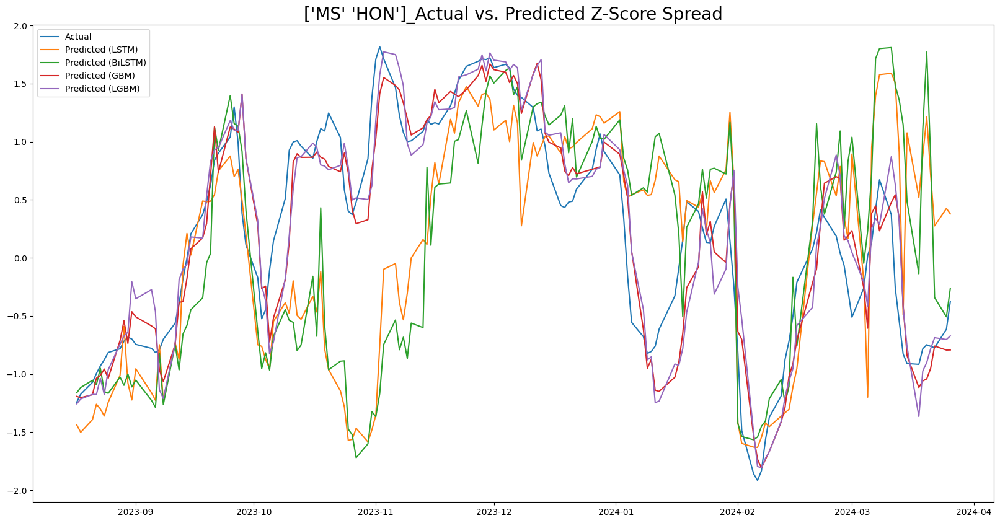

<Figure size 640x480 with 0 Axes>

In [128]:
# RESULT TO PICKLE
results_model_lstm = {}
#pickle the partial results
import pickle
for p in range(30):
    model_results = {}
    selected_config = {
            'PAIR_IDX': p,  
            'ADD_SENTIMENT_MA': True,
            'SPREAD_WINDOW': None,
            'MA_HIGH': 45,
            'MA_LOW': 5,
            'LOOK_BACK': 2,
            'DROP_COLS': []
        }

    # Build the model configuration
    pair_df, X_train, y_train, X_test, y_test = build_configuration(selected_config) 
    pair_results = {
        'Pair': selected_config['PAIR_IDX'],
        'Adj Close_S1': pair_df['Adj Close_S1'].values,
        'Adj Close_S2': pair_df['Adj Close_S2'].values,
        'y_test': y_test,
        'Models': {}
    }


    base_models = [
        LinearRegression(),
        GradientBoostingRegressor(random_state=42),
        LGBMRegressor(random_state=42, verbose=-1),
        # SGDRegressor(random_state=42),
        RandomForestRegressor(n_estimators=100, random_state=42),
        SVR(),
        KNeighborsRegressor(),
        
    ]

    for model in base_models:
        y_pred = train(model, X_train, y_train, X_test, y_test, model_results, plot=False)
        
        pair_results['Models'][model.__class__.__name__] = {
            'y_pred': y_pred,
            
            'metrics': model_results[model.__class__.__name__]
        }

    ######## LSTM ########
    def calculate_padding(features, look_back):
        return (look_back - (features % look_back)) % look_back
    pair_df, X_train, y_train, X_test, y_test = build_configuration(selected_config)
    LOOK_BACK = 3
    padding_train = calculate_padding(X_train.shape[1], LOOK_BACK)
    padding_test = calculate_padding(X_test.shape[1], LOOK_BACK)

    # Pad both training and testing feature sets
    X_train_padded = np.pad(X_train.values, ((0, 0), (0, padding_train)), 'constant', constant_values=0)
    X_test_padded = np.pad(X_test.values, ((0, 0), (0, padding_test)), 'constant', constant_values=0)

    # Reshape both sets for LSTM
    X_train_lstm = X_train_padded.reshape((X_train.shape[0], LOOK_BACK, -1))
    X_test_lstm = X_test_padded.reshape((X_test.shape[0], LOOK_BACK, -1))


    # Build the LSTM model
    model_lstm = Sequential([
        LSTM(200, return_sequences=True, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
        Dropout(0.1),
        LSTM(200, return_sequences=True),
        LSTM(50),  
        Dense(1)
    ])

    model_lstm.compile(optimizer='adam', loss='mse')

    # Fit the model
    model_lstm.fit(X_train_lstm, y_train, epochs=200, verbose=0)

    # Predict
    y_pred_lstm = model_lstm.predict(X_test_lstm)

    lstm_metric = calculate_metrics(y_test, y_pred_lstm.flatten())

    pair_results['Models']['LSTM'] = {
        'y_pred': y_pred_lstm,
        'metrics':  lstm_metric
    }

    model_bilstm = Sequential([
            Bidirectional(LSTM(70, return_sequences=True), input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])),
            Dropout(0.1),  # Dropout for regularizing and preventing overfitting
            Bidirectional(LSTM(50, return_sequences=True)),
            Dropout(0.1),
            Bidirectional(LSTM(50)),
            Dense(1)  # Output layer
        ])

    model_bilstm.compile(optimizer='adam', loss='mse')

    # Fit the model
    model_bilstm.fit(X_train_lstm, y_train, epochs=200, verbose=0)

    # Predict
    y_pred_bilstm = model_bilstm.predict(X_test_lstm)

    # Evaluate
    bi_lstm = calculate_metrics(y_test, y_pred_bilstm.flatten())
    pair_results['Models']['BiLSTM'] = {
        'y_pred': y_pred_bilstm,
        'metrics': bi_lstm
    }
    # Plot actual vs. predicted values


    fig, ax = plt.subplots(figsize=(20, 10))
    # title
    ax.set_title(f'{pairs[p]}_Actual vs. Predicted Z-Score Spread', fontsize=20)
    ax.plot(y_test.index, y_test, label="Actual")
    ax.plot(y_test.index, y_pred_lstm, label="Predicted (LSTM)")
    ax.plot(y_test.index, y_pred_bilstm, label="Predicted (BiLSTM)")
    #GradientBoostingRegressor
    ax.plot(y_test.index, pair_results['Models']['GradientBoostingRegressor']['y_pred'], label="Predicted (GBM)")
    ax.plot(y_test.index, pair_results['Models']['LGBMRegressor']['y_pred'], label="Predicted (LGBM)")

    ax.legend()
    plt.show()
    plt.savefig(f'{pairs[p]}_actual_vs_predicted.png')
    results_model_lstm[p] = pair_results
    

    with open(f'{pairs[p]}_pair_results.pkl', 'wb') as f:
        pickle.dump(pair_results, f)
    
    

In [129]:
with open('pairwise_model_results_lstm.pickle', 'wb') as handle:
    pickle.dump(results_model_lstm, handle)

In [130]:
for i in results_model_lstm:
    print(i)
    print(results_model_lstm[i])

0
{'Pair': 0, 'Adj Close_S1': array([341.71, 344.95, 348.  , 344.2 , 339.33, 331.77, 328.65, 330.55,
       327.39, 325.73, 332.01, 327.  , 327.64, 323.54, 327.06, 326.55,
       331.14, 330.81, 331.84, 327.68, 335.35, 338.55, 342.31, 343.09,
       331.88, 335.27, 330.85, 339.35, 343.52, 346.63, 348.11, 352.97,
       348.45, 350.16, 349.84, 357.62, 365.97, 370.89, 368.68, 359.92,
       354.4 , 358.81, 368.77, 369.25, 364.56, 358.38, 359.78, 366.26,
       368.29, 364.51, 367.4 , 371.37, 372.02, 382.44, 383.44, 388.72,
       391.45, 388.16, 384.7 , 382.78, 373.94, 378.05, 372.92, 371.3 ,
       371.  , 361.5 , 348.83, 357.54, 357.53, 361.05, 368.75, 368.77,
       368.71, 372.62, 379.53, 374.99, 374.16, 369.86, 367.67, 358.94,
       371.76, 380.5 , 375.98, 374.4 , 373.35, 364.8 , 354.72, 364.76,
       373.5 , 372.71, 374.05, 375.9 , 374.84, 374.23, 377.55, 374.88,
       378.19, 380.36, 377.86, 384.3 , 397.89, 399.88, 407.97, 413.89,
       415.  , 410.78, 408.35, 404.97, 398.8 , 

{'Pair': 10, 'Adj Close_S1': array([75.08, 75.13, 74.87, 74.23, 75.29, 76.56, 77.42, 76.62, 76.46,
       76.2 , 77.65, 78.03, 77.28, 77.52, 78.76, 78.71, 79.76, 79.86,
       79.63, 79.49, 79.31, 79.08, 78.14, 76.89, 76.48, 75.16, 73.82,
       71.46, 68.86, 67.61, 68.45, 68.96, 69.65, 71.32, 71.55, 71.51,
       69.68, 70.75, 71.01, 70.41, 68.21, 67.93, 66.73, 68.45, 69.44,
       68.37, 68.17, 68.45, 66.9 , 65.08, 66.29, 67.89, 66.93, 66.71,
       67.77, 67.98, 68.1 , 68.81, 67.62, 67.73, 68.88, 68.52, 69.69,
       71.07, 71.52, 72.98, 74.3 , 74.13, 73.11, 72.1 , 71.62, 71.12,
       69.84, 70.25, 70.89, 72.04, 73.18, 72.44, 72.99, 71.67, 71.91,
       71.31, 71.5 , 71.17, 70.82, 70.04, 70.46, 69.57, 70.52, 68.78,
       70.45, 70.  , 69.96, 67.3 , 66.94, 68.24, 70.88, 71.18, 72.26,
       71.37, 71.53, 70.18, 71.18, 71.29, 72.53, 72.42, 72.19, 72.35,
       71.68, 70.64, 70.26, 70.8 , 72.29, 71.61, 71.76, 71.82, 70.51,
       71.37, 70.83, 70.65, 70.31, 70.88, 69.16, 69.61, 68.6 

In [131]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'results' is your loaded dictionary
data = []

for i in range(len(results_model_lstm)):
    pair_data = results_model_lstm[i]
    for model_name, model_info in pair_data['Models'].items():
        data.append({
            'Pair': pair_data['Pair'],
            'Model': model_name,
            **model_info['metrics']
        })

# Create DataFrame
df = pd.DataFrame(data)

# Preview the DataFrame
print(df.head(20))


    Pair                      Model      mape       mse       mae        r2
0      0           LinearRegression  4.329262  0.564615  0.598202  0.298565
1      0  GradientBoostingRegressor  2.796604  0.115050  0.275785  0.857071
2      0              LGBMRegressor  3.503799  0.116343  0.270841  0.855464
3      0      RandomForestRegressor  3.289605  0.135355  0.281894  0.831845
4      0                        SVR  1.958376  0.564343  0.597107  0.298904
5      0        KNeighborsRegressor  5.872767  0.958476  0.812380 -0.190737
6      0                       LSTM  4.881426  0.657623  0.637926  0.183020
7      0                     BiLSTM  5.792508  0.917089  0.751659 -0.139320
8      1           LinearRegression  5.192951  1.983580  1.064394 -1.487360
9      1  GradientBoostingRegressor  1.948068  0.168452  0.305450  0.788766
10     1              LGBMRegressor  2.198138  0.143436  0.295975  0.820135
11     1      RandomForestRegressor  1.996913  0.142841  0.285854  0.820881
12     1    

In [132]:
# Compute average metrics for each model
average_metrics = df.groupby('Model').mean()

# Preview average metrics
print(average_metrics)


                           Pair      mape       mse       mae        r2
Model                                                                  
BiLSTM                     14.5  4.117261  0.816500  0.687414  0.229962
GradientBoostingRegressor  14.5  1.251338  0.106028  0.243026  0.899270
KNeighborsRegressor        14.5  4.681627  1.914410  1.130698 -0.709057
LGBMRegressor              14.5  1.318046  0.106776  0.245894  0.899531
LSTM                       14.5  3.663321  0.875832  0.723657  0.208250
LinearRegression           14.5  5.536424  1.296935  0.887702 -0.143768
RandomForestRegressor      14.5  1.461916  0.107257  0.245118  0.899664
SVR                        14.5  4.471409  2.124645  1.143377 -0.793218


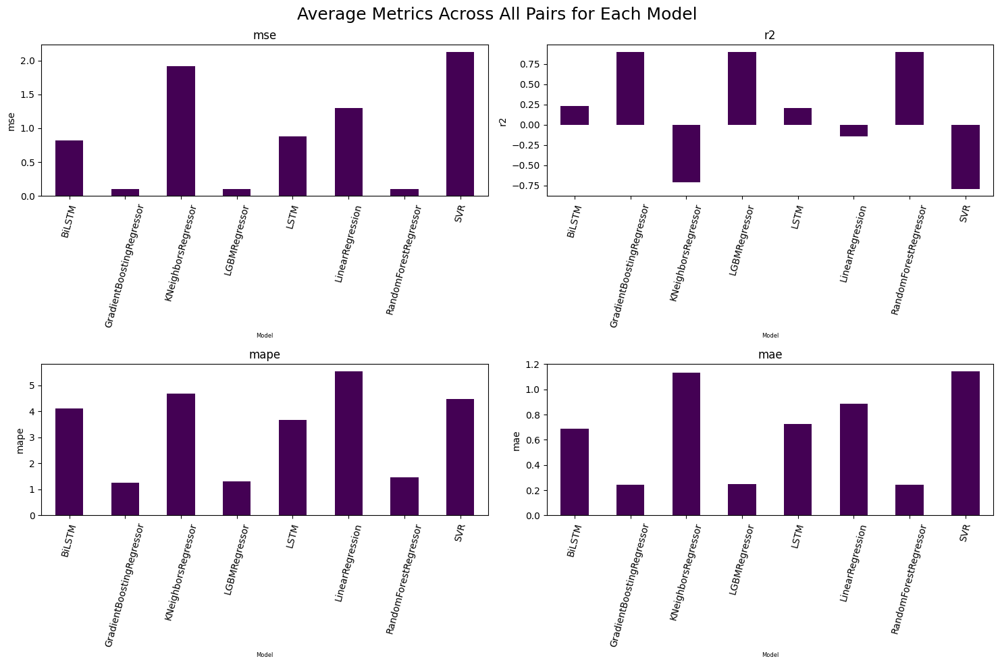

In [133]:
# Plotting
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))
fig.suptitle('Average Metrics Across All Pairs for Each Model', fontsize=18)

metrics_to_plot = ['mse', 'r2', 'mape', 'mae']
# remove LinearRegression
#average_metrics = average_metrics.drop('LinearRegression')  
for ax, metric in zip(axes.flatten(), metrics_to_plot):
    average_metrics[metric].plot(kind='bar', ax=ax, colormap='viridis')
    ax.set_title(metric)
    ax.set_ylabel(metric)
    ax.set_xlabel('Model',fontsize= 6)
    ax.tick_params(axis='x', rotation=75)

plt.tight_layout()  
plt.show()


In [134]:
#show my lstm model and bilstm architectures
model_lstm.summary()
model_bilstm.summary()

Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_429 (LSTM)                 │ (None, 3, 200)         │       232,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_232 (Dropout)           │ (None, 3, 200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_430 (LSTM)                 │ (None, 3, 200)         │       320,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_431 (LSTM)                 │ (None, 50)             │        50,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_168 (Dense)               │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,811,555 (6.91 MB)

 Trainable params: 603,851 (2.30 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,207,704 (4.61 MB)

Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_192               │ (None, 3, 140)         │        90,160 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_233 (Dropout)           │ (None, 3, 140)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_193               │ (None, 3, 100)         │        76,400 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_234 (Dropout)           │ (None, 3, 100)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_194               │ (None, 100)            │        60,400 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 1)              │           101 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 681,185 (2.60 MB)

 Trainable params: 227,061 (886.96 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 454,124 (1.73 MB)